In [7]:
[
    {
        "type": "command",
        "details": {
            "key": "jupyter.insertCellBelow"
        }
    }
]

[{'type': 'command', 'details': {'key': 'jupyter.insertCellBelow'}}]

In [6]:
!pip install python-dotenv


[notice] A new release of pip is available: 25.1.1 -> 25.2
[notice] To update, run: C:\Users\EL76\AppData\Local\Programs\Python\Python313\python.exe -m pip install --upgrade pip


In [4]:
# 1단계: 현재 Python 환경 확인
import sys
print(f"현재 Python 실행 경로: {sys.executable}")
print(f"현재 Python 버전: {sys.version}")

# 2단계: 현재 환경에 python-dotenv 설치
import subprocess
result = subprocess.run([sys.executable, '-m', 'pip', 'install', 'python-dotenv'], 
                       capture_output=True, text=True)
print("설치 결과:")
print(result.stdout)
if result.stderr:
    print("오류 메시지:", result.stderr)

현재 Python 실행 경로: c:\Users\EL76\AppData\Local\Programs\Python\Python311\python.exe
현재 Python 버전: 3.11.9 (tags/v3.11.9:de54cf5, Apr  2 2024, 10:12:12) [MSC v.1938 64 bit (AMD64)]
설치 결과:
  Using cached python_dotenv-1.1.1-py3-none-any.whl.metadata (24 kB)
Using cached python_dotenv-1.1.1-py3-none-any.whl (20 kB)

오류 메시지: 
[notice] A new release of pip is available: 24.0 -> 25.2
[notice] To update, run: python.exe -m pip install --upgrade pip



In [5]:
# 설치 확인 및 테스트
try:
    import dotenv
    print("✅ python-dotenv 설치 성공!")
    print(f"dotenv 모듈 위치: {dotenv.__file__}")
    
    # .env 파일 로드 테스트
    from dotenv import load_dotenv
    print("✅ load_dotenv 함수 import 성공!")
    
except ImportError as e:
    print(f"❌ 설치 실패: {e}")

✅ python-dotenv 설치 성공!
dotenv 모듈 위치: c:\Users\EL76\AppData\Local\Programs\Python\Python311\Lib\site-packages\dotenv\__init__.py
✅ load_dotenv 함수 import 성공!


In [ ]:
"""
Azure Document Intelligence OCR 데이터 분석
- 실시간 Azure API 호출
- Confidence 값 통계 분석
- 환경변수 기반 설정
"""

import os
import json
import glob
import numpy as np
from dotenv import load_dotenv

# 환경변수 로드
load_dotenv()

# Azure SDK imports (선택적)
try:
    from azure.core.credentials import AzureKeyCredential
    from azure.ai.documentintelligence import DocumentIntelligenceClient
    from azure.ai.documentintelligence.models import AnalyzeDocumentRequest
    AZURE_SDK_AVAILABLE = True
    print("✅ Azure SDK 사용 가능")
except ImportError:
    AZURE_SDK_AVAILABLE = False
    print("⚠️ Azure SDK 없음. 기존 JSON 파일만 분석 가능")

class OCRDataAnalyzer:
    def __init__(self, use_api: bool = False):
        """
        OCR 데이터 분석기 초기화
        Args:
            use_api: True면 실시간 API 호출, False면 기존 JSON 파일 분석
        """
        self.use_api = use_api
        self.azure_client = None
        
        if use_api and AZURE_SDK_AVAILABLE:
            self._setup_azure_client()
    
    def _setup_azure_client(self):
        """Azure 클라이언트 설정"""
        endpoint = os.getenv('AZURE_DOCUMENT_INTELLIGENCE_ENDPOINT')
        key = os.getenv('AZURE_DOCUMENT_INTELLIGENCE_KEY')
        
        if not endpoint or not key:
            print("❌ Azure 환경변수가 설정되지 않았습니다.")
            return False
        
        try:
            self.azure_client = DocumentIntelligenceClient(
                endpoint=endpoint,
                credential=AzureKeyCredential(key)
            )
            print("✅ Azure 클라이언트 연결 성공")
            return True
        except Exception as e:
            print(f"❌ Azure 클라이언트 연결 실패: {e}")
            return False
    
    def analyze_image_with_azure(self, image_path: str) -> dict:
        """실시간 Azure API로 이미지 분석"""
        if not self.azure_client:
            raise ValueError("Azure 클라이언트가 설정되지 않았습니다.")
        
        try:
            with open(image_path, 'rb') as f:
                image_data = f.read()
            
            print(f"📄 Azure로 분석 중: {os.path.basename(image_path)}")
            
            poller = self.azure_client.begin_analyze_document(
                "prebuilt-read",
                AnalyzeDocumentRequest(bytes_source=image_data)
            )
            
            result = poller.result()
            
            # 표준 JSON 형태로 변환
            ocr_result = {
                "analyzeResult": {
                    "pages": [],
                    "version": "4.0",
                    "apiVersion": "2024-02-29-preview",
                    "modelId": "prebuilt-read"
                }
            }
            
            for page_idx, page in enumerate(result.pages):
                page_data = {
                    "pageNumber": page_idx + 1,
                    "words": []
                }
                
                if hasattr(page, 'words') and page.words:
                    for word in page.words:
                        word_data = {
                            "content": word.content,
                            "confidence": word.confidence if hasattr(word, 'confidence') else 0.9,
                            "polygon": list(word.polygon) if hasattr(word, 'polygon') else [],
                            "span": {
                                "offset": word.span.offset if hasattr(word, 'span') else 0,
                                "length": word.span.length if hasattr(word, 'span') else len(word.content)
                            }
                        }
                        page_data["words"].append(word_data)
                
                ocr_result["analyzeResult"]["pages"].append(page_data)
            
            print(f"✅ Azure 분석 완료")
            return ocr_result
            
        except Exception as e:
            print(f"❌ Azure 분석 실패: {e}")
            return None
    
    def load_existing_json(self, json_path: str) -> dict:
        """기존 JSON 파일 로드"""
        try:
            with open(json_path, 'r', encoding='utf-8') as f:
                return json.load(f)
        except Exception as e:
            print(f"❌ JSON 로드 실패: {e}")
            return None
    
    def extract_confidences(self, ocr_data: dict) -> list:
        """OCR 데이터에서 confidence 값들 추출"""
        def find_confidences(obj):
            result = []
            if isinstance(obj, dict):
                for k, v in obj.items():
                    if k == "confidence":
                        result.append(v)
                    else:
                        result.extend(find_confidences(v))
            elif isinstance(obj, list):
                for item in obj:
                    result.extend(find_confidences(item))
            return result
        
        return find_confidences(ocr_data)
    
    def analyze_multiple_files(self, file_list: list, is_image: bool = False):
        """여러 파일 분석"""
        all_confidences = []
        file_confidence_dict = {}
        
        for file_path in file_list:
            if not os.path.exists(file_path):
                print(f"⚠️ 파일 없음: {file_path}")
                continue
            
            # 실시간 API 사용 또는 기존 JSON 로드
            if is_image and self.use_api:
                ocr_data = self.analyze_image_with_azure(file_path)
            else:
                ocr_data = self.load_existing_json(file_path)
            
            if ocr_data:
                confidences = self.extract_confidences(ocr_data)
                file_confidence_dict[os.path.basename(file_path)] = confidences
                all_confidences.extend(confidences)
                print(f"✅ {os.path.basename(file_path)}: {len(confidences)}개 confidence 값")
        
        return all_confidences, file_confidence_dict
    
    def print_statistics(self, all_confidences: list, file_confidence_dict: dict):
        """통계 출력"""
        print("\n" + "="*60)
        print("📊 Confidence 분석 결과")
        print("="*60)
        
        # 각 파일별 평균
        print("\n📁 각 파일별 confidence 평균:")
        for fname, confs in file_confidence_dict.items():
            avg = sum(confs) / len(confs) if confs else 0
            print(f"  {fname}: {avg:.4f} (총 {len(confs)}개)")
        
        # 전체 평균
        if all_confidences:
            total_avg = sum(all_confidences) / len(all_confidences)
            print(f"\n🎯 모든 파일의 confidence 전체 평균: {total_avg:.4f}")
            print(f"📊 총 단어 수: {len(all_confidences)}개")
            
            # 추가 통계
            print(f"📈 최고 신뢰도: {max(all_confidences):.4f}")
            print(f"📉 최저 신뢰도: {min(all_confidences):.4f}")
            print(f"📊 표준편차: {np.std(all_confidences):.4f}")
            
            # 신뢰도 구간별 분포
            high_conf = len([c for c in all_confidences if c >= 0.9])
            medium_conf = len([c for c in all_confidences if 0.7 <= c < 0.9])
            low_conf = len([c for c in all_confidences if c < 0.7])
            
            print(f"\n📊 신뢰도 구간별 분포:")
            print(f"  🟢 높음 (0.9 이상): {high_conf}개 ({high_conf/len(all_confidences)*100:.1f}%)")
            print(f"  🟡 보통 (0.7-0.9): {medium_conf}개 ({medium_conf/len(all_confidences)*100:.1f}%)")
            print(f"  🔴 낮음 (0.7 미만): {low_conf}개 ({low_conf/len(all_confidences)*100:.1f}%)")
        else:
            print("\n❌ confidence 값이 없습니다.")

# 메인 실행 부분
def main():
    print("🚀 Azure Document Intelligence OCR 데이터 분석 시작")
    
    # 분석 모드 선택
    use_realtime_api = False  # True로 변경하면 실시간 API 사용
    
    analyzer = OCRDataAnalyzer(use_api=use_realtime_api)
    
    if use_realtime_api:
        # 실시간 API 사용 - 이미지 파일들
        image_folder = r"C:\Users\EL76\OneDrive\Desktop\IT\Project\5eyes-Hoyeon\data\raw\training\원천"
        image_files = [
            os.path.join(image_folder, f"태조실록_001권_총서_00{i}{'a' if j==0 else 'b'}면.jpg")
            for i in range(1, 6) for j in range(2)
        ]
        
        # 존재하는 파일만 필터링
        existing_images = [f for f in image_files if os.path.exists(f)]
        print(f"📁 분석 대상 이미지: {len(existing_images)}개")
        
        all_confidences, file_confidence_dict = analyzer.analyze_multiple_files(
            existing_images, is_image=True
        )
    else:
        # 기존 JSON 파일 분석
        json_folder = r"C:\Users\EL76\Downloads"
        json_files = [
            "태조실록_001권_총서_001a면.png.json",
            "태조실록_001권_총서_001b면.png.json",
            "태조실록_001권_총서_002a면.png.json",
            "태조실록_001권_총서_002b면.png.json",
            "태조실록_001권_총서_003a면.png.json",
            "태조실록_001권_총서_003b면.png.json",
            "태조실록_001권_총서_004a면.png.json",
            "태조실록_001권_총서_004b면.png.json",
            "태조실록_001권_총서_005a면.png.json",
            "태조실록_001권_총서_005b면.png.json"
        ]
        
        json_paths = [os.path.join(json_folder, fname) for fname in json_files]
        existing_jsons = [f for f in json_paths if os.path.exists(f)]
        print(f"📁 분석 대상 JSON: {len(existing_jsons)}개")
        
        all_confidences, file_confidence_dict = analyzer.analyze_multiple_files(
            existing_jsons, is_image=False
        )
    
    # 통계 출력
    analyzer.print_statistics(all_confidences, file_confidence_dict)

if __name__ == "__main__":
    main()

✅ Azure SDK 사용 가능
🚀 Azure Document Intelligence OCR 데이터 분석 시작
📁 분석 대상 JSON: 10개
✅ 태조실록_001권_총서_001a면.png.json: 346개 confidence 값
✅ 태조실록_001권_총서_001b면.png.json: 354개 confidence 값
✅ 태조실록_001권_총서_002a면.png.json: 359개 confidence 값
✅ 태조실록_001권_총서_002b면.png.json: 355개 confidence 값
✅ 태조실록_001권_총서_003a면.png.json: 359개 confidence 값
✅ 태조실록_001권_총서_003b면.png.json: 358개 confidence 값
✅ 태조실록_001권_총서_004a면.png.json: 359개 confidence 값
✅ 태조실록_001권_총서_004b면.png.json: 358개 confidence 값
✅ 태조실록_001권_총서_005a면.png.json: 357개 confidence 값
✅ 태조실록_001권_총서_005b면.png.json: 352개 confidence 값

📊 Confidence 분석 결과

📁 각 파일별 confidence 평균:
  태조실록_001권_총서_001a면.png.json: 0.8639 (총 346개)
  태조실록_001권_총서_001b면.png.json: 0.8787 (총 354개)
  태조실록_001권_총서_002a면.png.json: 0.8793 (총 359개)
  태조실록_001권_총서_002b면.png.json: 0.8613 (총 355개)
  태조실록_001권_총서_003a면.png.json: 0.8578 (총 359개)
  태조실록_001권_총서_003b면.png.json: 0.8644 (총 358개)
  태조실록_001권_총서_004a면.png.json: 0.8619 (총 359개)
  태조실록_001권_총서_004b면.png.json: 0.8252 (총 358개)
  태조실록_001

In [ ]:
# 모든 confidence 값 수집
confidences = []
words_info = []

for page in data["analyzeResult"]["pages"]:
    for word in page["words"]:
        confidences.append(word["confidence"])
        words_info.append(word)

# 평균 계산
avg_conf = sum(confidences) / len(confidences)

# 평균보다 낮은 것들의 content, length 출력
print(f"전체 평균 confidence: {avg_conf:.4f}\n")
print("평균보다 낮은 confidence의 content와 length:")
for word in words_info:
    if word["confidence"] < avg_conf:
        print(f"content: {word['content']}, length: {word['span']['length']}, confidence: {word['confidence']}")

전체 평균 confidence: 0.8474

평균보다 낮은 confidence의 content와 length:
content: 麗, length: 1, confidence: 0.769
content: 忠, length: 1, confidence: 0.722
content: 蘭, length: 1, confidence: 0.742
content: 誕, length: 1, confidence: 0.672
content: 求, length: 1, confidence: 0.759
content: 舞, length: 1, confidence: 0.243
content: 版, length: 1, confidence: 0.218
content: 私, length: 1, confidence: 0.763
content: 募, length: 1, confidence: 0.739
content: 聰, length: 1, confidence: 0.758
content: 賴, length: 1, confidence: 0.699
content: 病, length: 1, confidence: 0.607
content: 於, length: 1, confidence: 0.284
content: 期, length: 1, confidence: 0.54
content: 人, length: 1, confidence: 0.827
content: 驚, length: 1, confidence: 0.742
content: 必, length: 1, confidence: 0.708
content: 願, length: 1, confidence: 0.735
content: 檢, length: 1, confidence: 0.674
content: 李, length: 1, confidence: 0.824
content: 試, length: 1, confidence: 0.156
content: 乾, length: 1, confidence: 0.247
content: 祖, length: 1, confidence: 0

PIL로 이미지 로드 성공: (2400, 3744), 모드: RGB


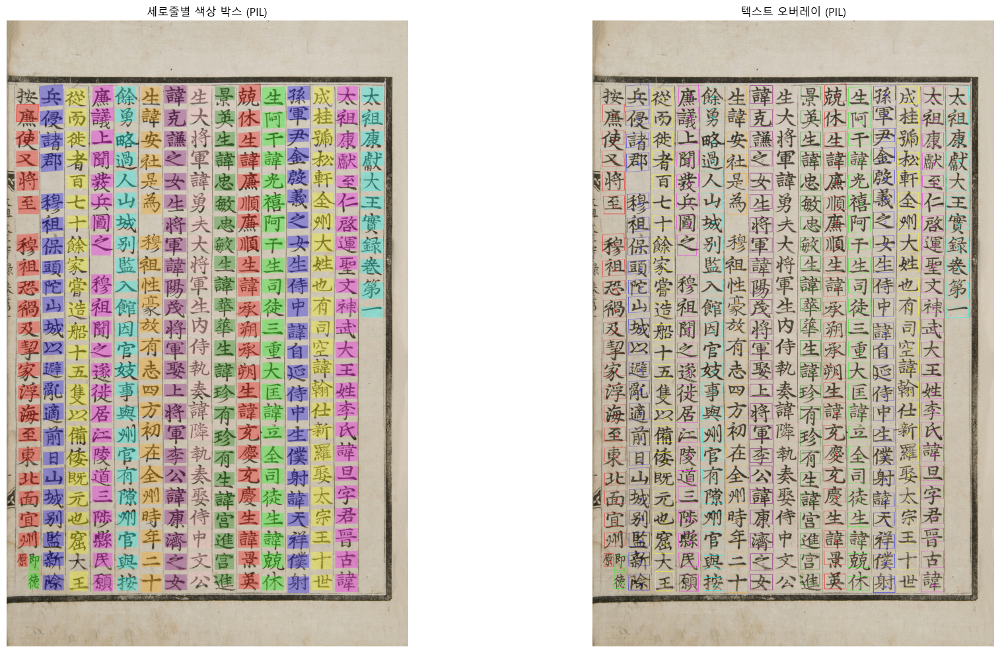


세로줄별 Confidence 통계:

Line_0:
  단어 수: 21
  평균 confidence: 0.8732
  최소 confidence: 0.0530
  최대 confidence: 0.9960

Line_1:
  단어 수: 2
  평균 confidence: 0.9710
  최소 confidence: 0.9500
  최대 confidence: 0.9920

Line_2:
  단어 수: 23
  평균 confidence: 0.9119
  최소 confidence: 0.2600
  최대 confidence: 0.9960

Line_3:
  단어 수: 23
  평균 confidence: 0.9043
  최소 confidence: 0.2140
  최대 confidence: 0.9960

Line_4:
  단어 수: 23
  평균 confidence: 0.8602
  최소 confidence: 0.2110
  최대 confidence: 0.9960

Line_5:
  단어 수: 24
  평균 confidence: 0.9135
  최소 confidence: 0.5070
  최대 confidence: 1.0000

Line_6:
  단어 수: 23
  평균 confidence: 0.9584
  최소 confidence: 0.7240
  최대 confidence: 0.9960

Line_7:
  단어 수: 24
  평균 confidence: 0.9273
  최소 confidence: 0.6780
  최대 confidence: 0.9950

Line_8:
  단어 수: 24
  평균 confidence: 0.9262
  최소 confidence: 0.7440
  최대 confidence: 0.9960

Line_9:
  단어 수: 24
  평균 confidence: 0.8791
  최소 confidence: 0.2410
  최대 confidence: 0.9960

Line_10:
  단어 수: 24
  평균 confidence: 0.8983
  최소 confidence

문서 처리 시작: 태조실록_001권_총서_001a면.jpg
총 342개 단어 추출됨
16개 세로줄로 그룹화됨


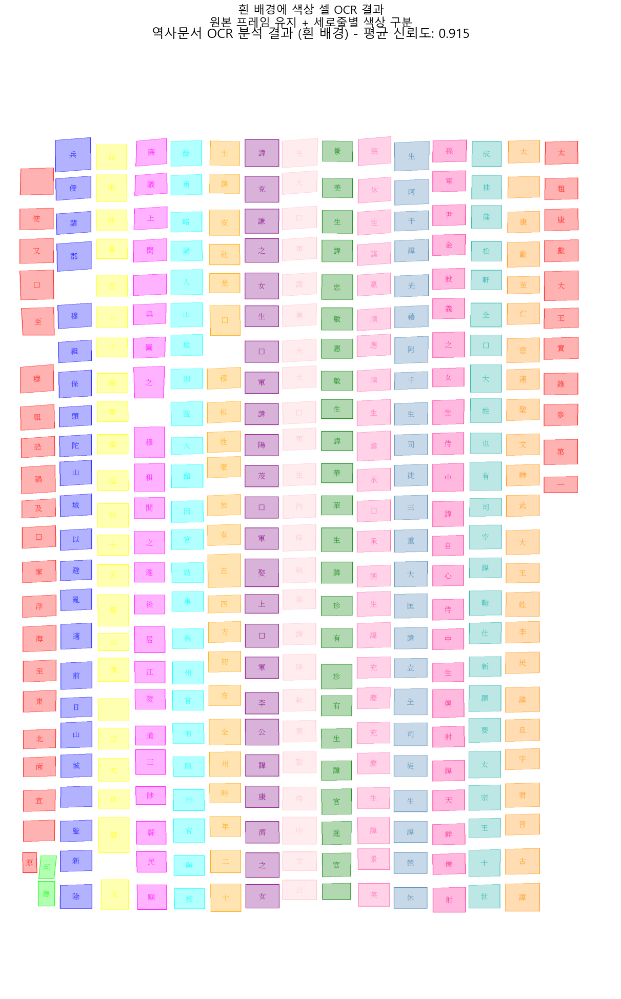


📊 세로줄별 OCR 결과 통계:
  세로줄_1: 21개 단어, 평균 신뢰도 0.873
    전체 텍스트: 應使又将至穆祖恐禍及挈家浮海至東北面宜州原...
  세로줄_2: 2개 단어, 평균 신뢰도 0.971
    전체 텍스트: 印德...
  세로줄_3: 23개 단어, 평균 신뢰도 0.912
    전체 텍스트: 兵侵諸郡穆祖保頭陀山城以避亂適前日山城別監新除...
  세로줄_4: 23개 단어, 평균 신뢰도 0.904
    전체 텍스트: 從兩徙者百七十餘家當造船十五隻以備倭既元也窟王...
  세로줄_5: 23개 단어, 평균 신뢰도 0.860
    전체 텍스트: 廉議上聞裝與圖之穆租聞之遂後居江陵道三陟縣民願...
  세로줄_6: 24개 단어, 평균 신뢰도 0.914
    전체 텍스트: 餘勇略過人山城別監入館因官妓事與州官有隙州官與按...
  세로줄_7: 23개 단어, 평균 신뢰도 0.958
    전체 텍스트: 生諱安社是為穆租性豪放有志四方初在全州時年二十...
  세로줄_8: 24개 단어, 평균 신뢰도 0.927
    전체 텍스트: 諱克謙之女生将軍諱陽茂将軍娶上将軍李公諱康濟之女...
  세로줄_9: 24개 단어, 평균 신뢰도 0.926
    전체 텍스트: 生大将軍諱勇夫大将軍生內侍執秦諱降執奏娶侍中文公...
  세로줄_10: 24개 단어, 평균 신뢰도 0.879
    전체 텍스트: 景美生諱忠敏惠敏生諱華華生諱珍有珍有生諱官進官生...
  세로줄_11: 24개 단어, 평균 신뢰도 0.898
    전체 텍스트: 兢休生諸贏順應順生諱承夠承朔生諱充慶充慶生諱景英...
  세로줄_12: 24개 단어, 평균 신뢰도 0.954
    전체 텍스트: 生阿干諱光禧阿千生司徒三重大匡諱立全司徒生諱兢休...
  세로줄_13: 24개 단어, 평균 신뢰도 0.928
    전체 텍스트: 孫軍尹金殷義之女生侍中諱自心侍中生僕射諱天祥僕射...
  세로줄_14: 24개 단어, 평균 신뢰도 0.937
    전체 텍스트: 成桂蒲松軒全则大姓也有司空諱翰仕新羅要太宗王十世...
  세로줄_15: 24개 단어, 평균 신뢰도 0

In [ ]:
import os
import numpy as np
import json
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt
from typing import List, Tuple, Dict
import matplotlib.font_manager as fm

class HistoricalDocumentWhiteBackgroundOCR:
    def __init__(self):
        # 세로줄별 색상 정의
        self.colors = [
            (255, 0, 0),    # 빨강
            (0, 255, 0),    # 초록  
            (0, 0, 255),    # 파랑
            (255, 255, 0),  # 노랑
            (255, 0, 255),  # 마젠타
            (0, 255, 255),  # 시안
            (255, 165, 0),  # 주황
            (128, 0, 128),  # 보라
            (255, 192, 203),# 핑크
            (0, 128, 0),    # 어두운 초록
            (255, 105, 180),# 핫핑크
            (70, 130, 180), # 스틸블루
            (255, 20, 147), # 딥핑크
            (32, 178, 170), # 라이트시그린
            (255, 140, 0),  # 다크오렌지
        ]
        
        # 한글 폰트 설정
        plt.rcParams['font.family'] = 'Malgun Gothic'
        plt.rcParams['axes.unicode_minus'] = False
    
    def load_azure_ocr_result(self, json_path: str) -> Dict:
        """Azure OCR 결과 JSON 파일 로드"""
        try:
            with open(json_path, 'r', encoding='utf-8') as f:
                return json.load(f)
        except Exception as e:
            raise FileNotFoundError(f"JSON 파일을 읽을 수 없습니다: {json_path}, 오류: {e}")
    
    def group_words_by_vertical_lines(self, words_data: List[Dict], threshold: float = 30) -> List[List[Dict]]:
        """단어들을 세로줄 기준으로 그룹화"""
        if not words_data:
            return []
            
        # X 좌표 기준으로 정렬
        sorted_words = sorted(words_data, key=lambda w: w['polygon'][0])
        
        vertical_lines = []
        current_line = [sorted_words[0]]
        
        for word in sorted_words[1:]:
            # 현재 줄의 평균 X 좌표와 비교
            current_line_avg_x = sum(w['polygon'][0] for w in current_line) / len(current_line)
            current_word_x = word['polygon'][0]
            
            if abs(current_word_x - current_line_avg_x) <= threshold:
                current_line.append(word)
            else:
                # Y 좌표 기준으로 정렬 (위에서 아래로)
                current_line.sort(key=lambda w: w['polygon'][1])
                vertical_lines.append(current_line)
                current_line = [word]
        
        # 마지막 줄 추가
        if current_line:
            current_line.sort(key=lambda w: w['polygon'][1])
            vertical_lines.append(current_line)
        
        return vertical_lines
    
    def create_white_background_with_colored_cells(self, image_path: str, vertical_lines: List[List[Dict]]) -> np.ndarray:
        """흰 배경에 색상 셀로 OCR 결과 표시"""
        try:
            # 원본 이미지 로드하여 크기 정보 얻기
            original_image = Image.open(image_path)
            width, height = original_image.size
            
            # 흰색 배경 이미지 생성
            white_image = Image.new('RGB', (width, height), (255, 255, 255))
            draw = ImageDraw.Draw(white_image)
            
            # 동적 폰트 크기 설정
            base_font_size = max(16, min(width, height) // 80)
            
            # 폰트 설정 (한자 표시에 적합한 폰트)
            font = None
            font_paths = [
                "C:/Windows/Fonts/batang.ttc",     # 바탕체 (한자 표시에 좋음)
                "C:/Windows/Fonts/malgun.ttf",     # 맑은 고딕
                "C:/Windows/Fonts/gulim.ttc",      # 굴림체
            ]
            
            for font_path in font_paths:
                try:
                    if os.path.exists(font_path):
                        font = ImageFont.truetype(font_path, base_font_size)
                        break
                except:
                    continue
            
            if font is None:
                font = ImageFont.load_default()
            
            # 세로줄별로 처리
            for line_idx, line_words in enumerate(vertical_lines):
                color = self.colors[line_idx % len(self.colors)]
                
                for word in line_words:
                    polygon = word['polygon']
                    content = word['content']
                    confidence = word['confidence']
                    
                    # 폴리곤 포인트 변환
                    points = [(polygon[i], polygon[i+1]) for i in range(0, len(polygon), 2)]
                    
                    # 1. 색상 셀 배경 그리기 (연한 색상)
                    light_color = tuple(int(c * 0.3 + 255 * 0.7) for c in color)  # 연한 색상
                    draw.polygon(points, fill=light_color, outline=color, width=2)
                    
                    # 2. OCR 인식된 텍스트 표시 (신뢰도 기준)
                    if confidence > 0.3:  # 낮은 신뢰도도 표시
                        # 박스의 중심점 계산
                        center_x = int(sum(p[0] for p in points) / len(points))
                        center_y = int(sum(p[1] for p in points) / len(points))
                        
                        # 텍스트 그리기 (해당 세로줄 색상으로)
                        draw.text((center_x, center_y), content, fill=color, font=font, anchor="mm")
            
            return np.array(white_image)
            
        except Exception as e:
            raise FileNotFoundError(f"이미지 처리 실패: {image_path}, 오류: {e}")
    
    def analyze_confidence_by_lines(self, vertical_lines: List[List[Dict]]) -> Dict:
        """세로줄별 confidence 분석"""
        line_stats = {}
        
        for line_idx, line_words in enumerate(vertical_lines):
            confidences = [word['confidence'] for word in line_words]
            texts = [word['content'] for word in line_words]
            
            line_stats[f'세로줄_{line_idx+1}'] = {
                'word_count': len(line_words),
                'avg_confidence': np.mean(confidences),
                'min_confidence': np.min(confidences),
                'max_confidence': np.max(confidences),
                'std_confidence': np.std(confidences),
                'low_confidence_words': [w for w in line_words if w['confidence'] < 0.7],
                'full_text': ''.join(texts),
                'words': [{'content': w['content'], 'confidence': w['confidence']} for w in line_words]
            }
        
        return line_stats
    
    def process_document_white_background(self, image_path: str, json_path: str) -> Tuple[np.ndarray, Dict]:
        """흰 배경 문서 처리 파이프라인"""
        print(f"문서 처리 시작: {os.path.basename(image_path)}")
        
        # OCR 결과 로드
        ocr_data = self.load_azure_ocr_result(json_path)
        
        # 단어 데이터 추출
        words_data = []
        for page in ocr_data["analyzeResult"]["pages"]:
            words_data.extend(page["words"])
        
        print(f"총 {len(words_data)}개 단어 추출됨")
        
        # 세로줄별 그룹화
        vertical_lines = self.group_words_by_vertical_lines(words_data)
        print(f"{len(vertical_lines)}개 세로줄로 그룹화됨")
        
        # 흰 배경에 색상 셀로 표시
        result_image = self.create_white_background_with_colored_cells(image_path, vertical_lines)
        
        # 통계 분석
        line_stats = self.analyze_confidence_by_lines(vertical_lines)
        
        return result_image, line_stats

# OCR 라이브러리 초기화
ocr_lib = HistoricalDocumentWhiteBackgroundOCR()

# 파일 경로 설정
image_path = r"C:\Users\EL76\OneDrive\Desktop\IT\Project\5eyes\data\raw\training\원천\태조실록_001권_총서_001a면.jpg"
json_path = r"C:\Users\EL76\OneDrive\Desktop\IT\Project\5eyes\data\raw\training\원천\태조실록_001권_총서_001a면.jpg.json"

# 파일 존재 여부 확인
if not os.path.exists(image_path):
    print(f"❌ 이미지 파일이 존재하지 않습니다: {image_path}")
else:
    if not os.path.exists(json_path):
        print(f"❌ JSON 파일이 존재하지 않습니다: {json_path}")
    else:
        try:
            # 문서 처리
            result_image, line_stats = ocr_lib.process_document_white_background(image_path, json_path)
            
            # VS Code 결과창에서 인라인으로 표시
            fig, ax = plt.subplots(1, 1, figsize=(16, 20))
            
            ax.imshow(result_image)
            ax.set_title('흰 배경에 색상 셀 OCR 결과\n원본 프레임 유지 + 세로줄별 색상 구분', 
                        fontsize=16, pad=20)
            ax.axis('off')
            
            # 통계 정보 추가
            total_confidence = np.mean([np.mean([w['confidence'] for w in stats['words']]) 
                                      for stats in line_stats.values()])
            fig.suptitle(f'역사문서 OCR 분석 결과 (흰 배경) - 평균 신뢰도: {total_confidence:.3f}', 
                        fontsize=18, y=0.95)
            
            plt.tight_layout()
            # VS Code에서 인라인으로 표시되도록 설정
            plt.show()
            
            # 통계 출력
            print(f"\n📊 세로줄별 OCR 결과 통계:")
            for line_name, stats in line_stats.items():
                print(f"  {line_name}: {stats['word_count']}개 단어, 평균 신뢰도 {stats['avg_confidence']:.3f}")
                print(f"    전체 텍스트: {stats['full_text'][:50]}...")  # 처음 50자만 표시
            
            print(f"\n✅ 처리 완료 - VS Code 결과창에 표시됨")
            
        except Exception as e:
            print(f"❌ 처리 중 오류 발생: {e}")

문서 처리 시작: 태조실록_001권_총서_001a면.jpg
총 342개 단어 추출됨
16개 세로줄로 그룹화됨


C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_14852\687704803.py:257: UserWarning: Glyph 23558 (\N{CJK UNIFIED IDEOGRAPH-5C06}) missing from font(s) Batang.
  plt.tight_layout()
C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_14852\687704803.py:257: UserWarning: Glyph 25352 (\N{CJK UNIFIED IDEOGRAPH-6308}) missing from font(s) Batang.
  plt.tight_layout()
C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_14852\687704803.py:257: UserWarning: Glyph 26082 (\N{CJK UNIFIED IDEOGRAPH-65E2}) missing from font(s) Batang.
  plt.tight_layout()
C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_14852\687704803.py:257: UserWarning: Glyph 28858 (\N{CJK UNIFIED IDEOGRAPH-70BA}) missing from font(s) Batang.
  plt.tight_layout()
C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_14852\687704803.py:257: UserWarning: Glyph 22816 (\N{CJK UNIFIED IDEOGRAPH-5920}) missing from font(s) Batang.
  plt.tight_layout()
C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_1485

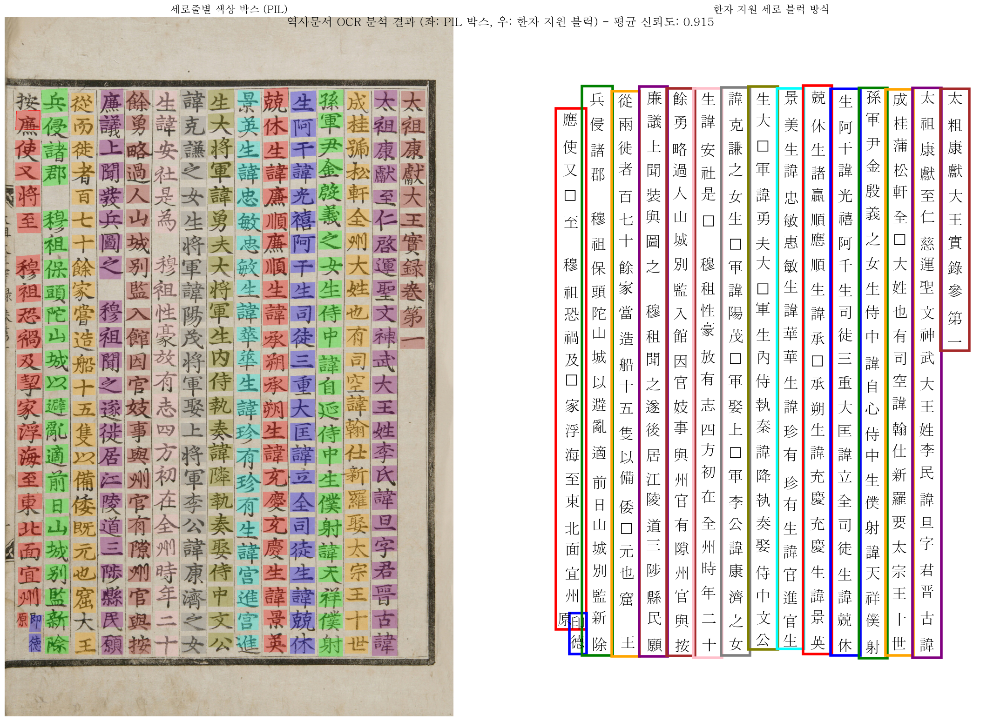


📊 세로줄별 OCR 결과 통계:
  Line 1: 21개 단어, 평균 신뢰도 0.873
    전체 텍스트: 應使又将至穆祖恐禍及挈家浮海至東北面宜州原...
  Line 2: 2개 단어, 평균 신뢰도 0.971
    전체 텍스트: 印德...
  Line 3: 23개 단어, 평균 신뢰도 0.912
    전체 텍스트: 兵侵諸郡穆祖保頭陀山城以避亂適前日山城別監新除...
  Line 4: 23개 단어, 평균 신뢰도 0.904
    전체 텍스트: 從兩徙者百七十餘家當造船十五隻以備倭既元也窟王...
  Line 5: 23개 단어, 평균 신뢰도 0.860
    전체 텍스트: 廉議上聞裝與圖之穆租聞之遂後居江陵道三陟縣民願...
  Line 6: 24개 단어, 평균 신뢰도 0.914
    전체 텍스트: 餘勇略過人山城別監入館因官妓事與州官有隙州官與按...
  Line 7: 23개 단어, 평균 신뢰도 0.958
    전체 텍스트: 生諱安社是為穆租性豪放有志四方初在全州時年二十...
  Line 8: 24개 단어, 평균 신뢰도 0.927
    전체 텍스트: 諱克謙之女生将軍諱陽茂将軍娶上将軍李公諱康濟之女...
  Line 9: 24개 단어, 평균 신뢰도 0.926
    전체 텍스트: 生大将軍諱勇夫大将軍生內侍執秦諱降執奏娶侍中文公...
  Line 10: 24개 단어, 평균 신뢰도 0.879
    전체 텍스트: 景美生諱忠敏惠敏生諱華華生諱珍有珍有生諱官進官生...
  Line 11: 24개 단어, 평균 신뢰도 0.898
    전체 텍스트: 兢休生諸贏順應順生諱承夠承朔生諱充慶充慶生諱景英...
  Line 12: 24개 단어, 평균 신뢰도 0.954
    전체 텍스트: 生阿干諱光禧阿千生司徒三重大匡諱立全司徒生諱兢休...
  Line 13: 24개 단어, 평균 신뢰도 0.928
    전체 텍스트: 孫軍尹金殷義之女生侍中諱自心侍中生僕射諱天祥僕射...
  Line 14: 24개 단어, 평균 신뢰도 0.937
    전체 텍스트: 成桂蒲松軒全则大姓也有司空諱翰仕新羅要太宗王十世...
  Line 15: 2

In [ ]:
import os
import numpy as np
import json
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.font_manager as fm
from typing import List, Tuple, Dict

class HistoricalDocumentDualViewOCR:
    def __init__(self):
        # 세로줄별 색상 정의
        self.colors = ['red', 'blue', 'green', 'orange', 'purple', 'brown', 'pink', 'gray', 'olive', 'cyan']
        
        # 한자 지원 폰트 설정
        self.han_font = self._setup_cjk_font()
        
    def _setup_cjk_font(self):
        """CJK(한중일) 문자 지원 폰트 설정"""
        # Windows 한자 지원 폰트 경로들
        han_font_paths = [
            "C:/Windows/Fonts/batang.ttc",      # 바탕체 (한자 지원 우수)
            "C:/Windows/Fonts/gulim.ttc",       # 굴림체 (한자 지원)
            "C:/Windows/Fonts/dotum.ttc",       # 돋움체 (한자 지원)
            "C:/Windows/Fonts/msyh.ttc",        # Microsoft YaHei (중국어)
            "C:/Windows/Fonts/simsun.ttc",      # SimSun (중국어)
            "C:/Windows/Fonts/NotoSansCJK-Regular.ttc", # Noto Sans CJK
        ]
        
        # 사용 가능한 첫 번째 폰트 찾기
        for font_path in han_font_paths:
            if os.path.exists(font_path):
                try:
                    return fm.FontProperties(fname=font_path)
                except:
                    continue
        
        # 기본 폰트 반환
        return fm.FontProperties()
    
    def load_azure_ocr_result(self, json_path: str) -> Dict:
        """Azure OCR 결과 JSON 파일 로드"""
        try:
            with open(json_path, 'r', encoding='utf-8') as f:
                return json.load(f)
        except Exception as e:
            raise FileNotFoundError(f"JSON 파일을 읽을 수 없습니다: {json_path}, 오류: {e}")
    
    def group_words_by_vertical_lines(self, words_data: List[Dict], threshold: float = 50) -> List[List[Dict]]:
        """단어들을 세로줄 기준으로 그룹화"""
        if not words_data:
            return []
            
        # X 좌표 기준으로 정렬
        sorted_words = sorted(words_data, key=lambda w: w['polygon'][0])
        
        vertical_lines = []
        current_line = [sorted_words[0]]
        
        for word in sorted_words[1:]:
            # 현재 줄의 평균 X 좌표와 비교
            current_line_avg_x = sum(w['polygon'][0] for w in current_line) / len(current_line)
            current_word_x = word['polygon'][0]
            
            if abs(current_word_x - current_line_avg_x) <= threshold:
                current_line.append(word)
            else:
                # Y 좌표 기준으로 정렬 (위에서 아래로)
                current_line.sort(key=lambda w: w['polygon'][1])
                vertical_lines.append(current_line)
                current_line = [word]
        
        # 마지막 줄 추가
        if current_line:
            current_line.sort(key=lambda w: w['polygon'][1])
            vertical_lines.append(current_line)
        
        return vertical_lines
    
    def draw_vertical_line_boxes_pil(self, image_path: str, vertical_lines: List[List[Dict]]) -> np.ndarray:
        """PIL을 사용한 세로줄별 색상 박스 그리기"""
        try:
            # PIL로 이미지 로드
            pil_image = Image.open(image_path)
            if pil_image.mode != 'RGB':
                pil_image = pil_image.convert('RGB')
            
            draw = ImageDraw.Draw(pil_image)
            
            for line_idx, line_words in enumerate(vertical_lines):
                # matplotlib 색상을 RGB 튜플로 변환
                color_name = self.colors[line_idx % len(self.colors)]
                if color_name == 'red':
                    color = (255, 0, 0)
                elif color_name == 'blue':
                    color = (0, 0, 255)
                elif color_name == 'green':
                    color = (0, 255, 0)
                elif color_name == 'orange':
                    color = (255, 165, 0)
                elif color_name == 'purple':
                    color = (128, 0, 128)
                elif color_name == 'brown':
                    color = (165, 42, 42)
                elif color_name == 'pink':
                    color = (255, 192, 203)
                elif color_name == 'gray':
                    color = (128, 128, 128)
                elif color_name == 'olive':
                    color = (128, 128, 0)
                else:  # cyan
                    color = (0, 255, 255)
                
                for word in line_words:
                    polygon = word['polygon']
                    points = [(polygon[i], polygon[i+1]) for i in range(0, len(polygon), 2)]
                    
                    # 박스 그리기
                    draw.polygon(points, outline=color, width=3)
                    
                    # 반투명 채우기
                    overlay = Image.new('RGBA', pil_image.size, (0, 0, 0, 0))
                    overlay_draw = ImageDraw.Draw(overlay)
                    overlay_draw.polygon(points, fill=(*color, 77))
                    
                    # 합성
                    pil_image = Image.alpha_composite(pil_image.convert('RGBA'), overlay).convert('RGB')
            
            return np.array(pil_image)
            
        except Exception as e:
            raise FileNotFoundError(f"PIL로 이미지를 읽을 수 없습니다: {image_path}, 오류: {e}")
    
    def get_bounding_box_for_line(self, line_words: List[Dict]) -> Tuple[int, int, int, int]:
        """세로줄의 전체 바운딩 박스 계산"""
        if not line_words:
            return (0, 0, 0, 0)
        
        all_points = []
        for word in line_words:
            polygon = word['polygon']
            points = [(polygon[i], polygon[i+1]) for i in range(0, len(polygon), 2)]
            all_points.extend(points)
        
        min_x = min(point[0] for point in all_points)
        max_x = max(point[0] for point in all_points)
        min_y = min(point[1] for point in all_points)
        max_y = max(point[1] for point in all_points)
        
        padding = 10
        return (
            int(min_x - padding),
            int(min_y - padding),
            int(max_x - min_x + 2 * padding),
            int(max_y - min_y + 2 * padding)
        )
    
    def create_line_stats(self, vertical_lines: List[List[Dict]]) -> Dict:
        """세로줄별 통계 생성"""
        line_stats = {}
        
        for line_idx, line_words in enumerate(vertical_lines):
            confidences = [word['confidence'] for word in line_words]
            texts = [word['content'] for word in line_words]
            
            bbox = self.get_bounding_box_for_line(line_words)
            
            word_bboxes = []
            for word in line_words:
                polygon = word['polygon']
                points = [(polygon[i], polygon[i+1]) for i in range(0, len(polygon), 2)]
                min_x = min(point[0] for point in points)
                max_x = max(point[0] for point in points)
                min_y = min(point[1] for point in points)
                max_y = max(point[1] for point in points)
                
                word_bboxes.append({
                    'text': word['content'],
                    'bbox': (int(min_x), int(min_y), int(max_x - min_x), int(max_y - min_y)),
                    'confidence': word['confidence']
                })
            
            line_stats[f'Line {line_idx + 1}'] = {
                'bbox': bbox,
                'words': word_bboxes,
                'word_count': len(line_words),
                'avg_confidence': np.mean(confidences),
                'full_text': ''.join(texts)
            }
        
        return line_stats
    
    def create_dual_visualization(self, image_path: str, json_path: str):
        """좌우 구성 시각화 생성"""
        print(f"문서 처리 시작: {os.path.basename(image_path)}")
        
        # OCR 결과 로드
        ocr_data = self.load_azure_ocr_result(json_path)
        
        # 단어 데이터 추출
        words_data = []
        for page in ocr_data["analyzeResult"]["pages"]:
            words_data.extend(page["words"])
        
        print(f"총 {len(words_data)}개 단어 추출됨")
        
        # 세로줄별 그룹화
        vertical_lines = self.group_words_by_vertical_lines(words_data)
        print(f"{len(vertical_lines)}개 세로줄로 그룹화됨")
        
        # 좌측용 박스 이미지 생성
        boxed_image = self.draw_vertical_line_boxes_pil(image_path, vertical_lines)
        
        # 우측용 통계 생성
        line_stats = self.create_line_stats(vertical_lines)
        
        # 원본 이미지 크기 가져오기
        original_image = Image.open(image_path)
        width, height = original_image.size
        
        # 좌우 구성 시각화
        fig, axes = plt.subplots(1, 2, figsize=(24, 16))
        
        # 좌측: 세로줄별 색상 박스 (PIL)
        axes[0].imshow(boxed_image)
        axes[0].set_title('세로줄별 색상 박스 (PIL)', fontproperties=self.han_font, fontsize=16)
        axes[0].axis('off')
        
        # 우측: 세로 블럭 방식 (한자 폰트 적용)
        white_image = np.ones((height, width, 3), dtype=np.uint8) * 255
        axes[1].imshow(white_image)
        axes[1].set_title('한자 지원 세로 블럭 방식', fontproperties=self.han_font, fontsize=16)
        axes[1].axis('off')
        
        # 우측에 세로 블럭 테두리와 한자 텍스트 추가
        for idx, (line_name, stats) in enumerate(line_stats.items()):
            x, y, w, h = stats['bbox']
            color = self.colors[idx % len(self.colors)]
            
            # 세로줄 전체 테두리
            rect = patches.Rectangle((x, y), w, h, linewidth=4, edgecolor=color, facecolor='none')
            axes[1].add_patch(rect)
            
            # OCR 글자 크게, 검정색으로 표시 (한자 폰트 적용)
            for word in stats['words']:
                wx, wy, ww, wh = word['bbox']
                axes[1].text(wx + ww/2, wy + wh/2, word['text'], 
                           fontsize=24, color='black', 
                           verticalalignment='center', horizontalalignment='center',
                           fontweight='bold', fontproperties=self.han_font)
        
        # 제목 및 통계 (한자 폰트 적용)
        total_confidence = np.mean([stats['avg_confidence'] for stats in line_stats.values()])
        fig.suptitle(f'역사문서 OCR 분석 결과 (좌: PIL 박스, 우: 한자 지원 블럭) - 평균 신뢰도: {total_confidence:.3f}', 
                    fontproperties=self.han_font, fontsize=18, y=0.95)
        
        plt.tight_layout()
        plt.show()
        
        # 통계 출력
        print(f"\n📊 세로줄별 OCR 결과 통계:")
        for line_name, stats in line_stats.items():
            print(f"  {line_name}: {stats['word_count']}개 단어, 평균 신뢰도 {stats['avg_confidence']:.3f}")
            print(f"    전체 텍스트: {stats['full_text'][:30]}...")
        
        return line_stats

# 실행 코드
ocr_processor = HistoricalDocumentDualViewOCR()

# 파일 경로 설정
image_path = r"C:\Users\EL76\OneDrive\Desktop\IT\Project\5eyes\data\raw\training\원천\태조실록_001권_총서_001a면.jpg"
json_path = r"C:\Users\EL76\OneDrive\Desktop\IT\Project\5eyes\data\raw\training\원천\태조실록_001권_총서_001a면.jpg.json"

# 파일 존재 여부 확인
if not os.path.exists(image_path):
    print(f"❌ 이미지 파일이 존재하지 않습니다: {image_path}")
elif not os.path.exists(json_path):
    print(f"❌ JSON 파일이 존재하지 않습니다: {json_path}")
else:
    try:
        # 좌우 구성 시각화 실행
        line_stats = ocr_processor.create_dual_visualization(image_path, json_path)
        print(f"\n✅ 처리 완료 - VS Code 결과창에 표시됨")
        
    except Exception as e:
        print(f"❌ 처리 중 오류 발생: {e}")

🚀 역사문서 OCR 분석 시작
✅ 사용 폰트: Batang
문서 처리 시작: 태조실록_001권_총서_001a면.jpg
총 342개 단어 추출됨
16개 세로줄로 그룹화됨


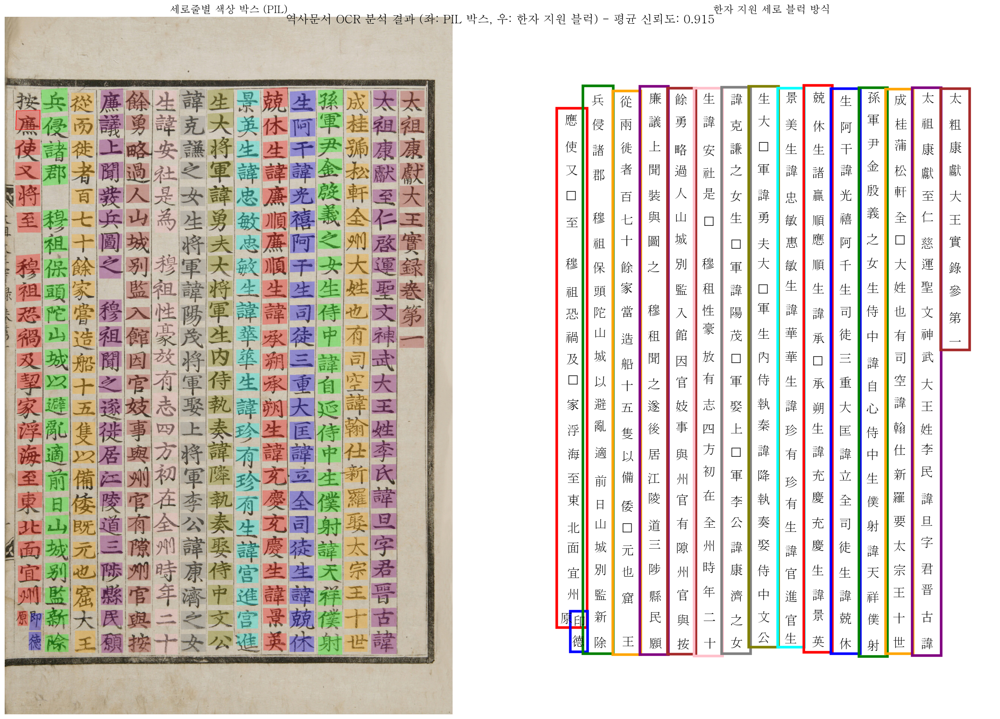


📊 세로줄별 OCR 결과 통계:
  Line 1: 21개 단어, 평균 신뢰도 0.873
    전체 텍스트: 應使又将至穆祖恐禍及挈家浮海至東北面宜州原...
  Line 2: 2개 단어, 평균 신뢰도 0.971
    전체 텍스트: 印德...
  Line 3: 23개 단어, 평균 신뢰도 0.912
    전체 텍스트: 兵侵諸郡穆祖保頭陀山城以避亂適前日山城別監新除...
  Line 4: 23개 단어, 평균 신뢰도 0.904
    전체 텍스트: 從兩徙者百七十餘家當造船十五隻以備倭既元也窟王...
  Line 5: 23개 단어, 평균 신뢰도 0.860
    전체 텍스트: 廉議上聞裝與圖之穆租聞之遂後居江陵道三陟縣民願...
  Line 6: 24개 단어, 평균 신뢰도 0.914
    전체 텍스트: 餘勇略過人山城別監入館因官妓事與州官有隙州官與按...
  Line 7: 23개 단어, 평균 신뢰도 0.958
    전체 텍스트: 生諱安社是為穆租性豪放有志四方初在全州時年二十...
  Line 8: 24개 단어, 평균 신뢰도 0.927
    전체 텍스트: 諱克謙之女生将軍諱陽茂将軍娶上将軍李公諱康濟之女...
  Line 9: 24개 단어, 평균 신뢰도 0.926
    전체 텍스트: 生大将軍諱勇夫大将軍生內侍執秦諱降執奏娶侍中文公...
  Line 10: 24개 단어, 평균 신뢰도 0.879
    전체 텍스트: 景美生諱忠敏惠敏生諱華華生諱珍有珍有生諱官進官生...
  Line 11: 24개 단어, 평균 신뢰도 0.898
    전체 텍스트: 兢休生諸贏順應順生諱承夠承朔生諱充慶充慶生諱景英...
  Line 12: 24개 단어, 평균 신뢰도 0.954
    전체 텍스트: 生阿干諱光禧阿千生司徒三重大匡諱立全司徒生諱兢休...
  Line 13: 24개 단어, 평균 신뢰도 0.928
    전체 텍스트: 孫軍尹金殷義之女生侍中諱自心侍中生僕射諱天祥僕射...
  Line 14: 24개 단어, 평균 신뢰도 0.937
    전체 텍스트: 成桂蒲松軒全则大姓也有司空諱翰仕新羅要太宗王十世...
  Line 15: 2

In [ ]:
import os
import numpy as np
import json
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.font_manager as fm
from typing import List, Tuple, Dict
import warnings

# 폰트 관련 경고 메시지 숨기기
warnings.filterwarnings('ignore', message='Glyph.*missing from font')

class HistoricalDocumentDualViewOCR:
    def __init__(self):
        # 세로줄별 색상 정의
        self.colors = ['red', 'blue', 'green', 'orange', 'purple', 'brown', 'pink', 'gray', 'olive', 'cyan']
        
        # 한자 지원 폰트 설정
        self.han_font = self._setup_cjk_font()
        print(f"✅ 사용 폰트: {self.han_font.get_name() if hasattr(self.han_font, 'get_name') else '기본 폰트'}")
        
    def _setup_cjk_font(self):
        """CJK(한중일) 문자 지원 폰트 설정 - 완전한 폰트 검색"""
        # 1. Windows 기본 한자 지원 폰트들
        windows_cjk_fonts = [
            "Batang",           # 바탕체
            "BatangChe",        # 바탕체
            "Gulim",            # 굴림체
            "GulimChe",         # 굴림체
            "Dotum",            # 돋움체
            "DotumChe",         # 돋움체
            "Gungsuh",          # 궁서체
            "GungsuhChe",       # 궁서체
            "Malgun Gothic",    # 맑은 고딕
            "Microsoft YaHei",  # 중국어 폰트
            "SimSun",           # 중국어 폰트
            "MS Gothic",        # 일본어 폰트
            "Yu Gothic",        # 일본어 폰트
        ]
        
        # 2. 폰트 파일 경로들
        font_file_paths = [
            "C:/Windows/Fonts/batang.ttc",
            "C:/Windows/Fonts/gulim.ttc", 
            "C:/Windows/Fonts/dotum.ttc",
            "C:/Windows/Fonts/malgun.ttf",
            "C:/Windows/Fonts/msyh.ttc",
            "C:/Windows/Fonts/simsun.ttc",
            "C:/Windows/Fonts/msgothic.ttc",
            "C:/Windows/Fonts/yugothic.ttf",
        ]
        
        # 3. 시스템에서 사용 가능한 모든 폰트 검색
        all_fonts = [f.name for f in fm.fontManager.ttflist]
        
        # 4. CJK 폰트 우선순위로 검색
        for font_name in windows_cjk_fonts:
            if font_name in all_fonts:
                try:
                    # 한자 테스트
                    test_font = fm.FontProperties(family=font_name)
                    return test_font
                except Exception:
                    continue
        
        # 5. 폰트 파일 직접 로드
        for font_path in font_file_paths:
            if os.path.exists(font_path):
                try:
                    return fm.FontProperties(fname=font_path)
                except Exception:
                    continue
        
        # 6. 마지막 대안: DejaVu Sans (유니코드 지원)
        try:
            return fm.FontProperties(family='DejaVu Sans')
        except:
            pass
        
        print("⚠️ 한자 지원 폰트를 찾을 수 없습니다. 기본 폰트를 사용합니다.")
        return fm.FontProperties()
    
    def load_azure_ocr_result(self, json_path: str) -> Dict:
        """Azure OCR 결과 JSON 파일 로드"""
        try:
            with open(json_path, 'r', encoding='utf-8') as f:
                return json.load(f)
        except Exception as e:
            raise FileNotFoundError(f"JSON 파일을 읽을 수 없습니다: {json_path}, 오류: {e}")
    
    def group_words_by_vertical_lines(self, words_data: List[Dict], threshold: float = 50) -> List[List[Dict]]:
        """단어들을 세로줄 기준으로 그룹화"""
        if not words_data:
            return []
            
        # X 좌표 기준으로 정렬
        sorted_words = sorted(words_data, key=lambda w: w['polygon'][0])
        
        vertical_lines = []
        current_line = [sorted_words[0]]
        
        for word in sorted_words[1:]:
            # 현재 줄의 평균 X 좌표와 비교
            current_line_avg_x = sum(w['polygon'][0] for w in current_line) / len(current_line)
            current_word_x = word['polygon'][0]
            
            if abs(current_word_x - current_line_avg_x) <= threshold:
                current_line.append(word)
            else:
                # Y 좌표 기준으로 정렬 (위에서 아래로)
                current_line.sort(key=lambda w: w['polygon'][1])
                vertical_lines.append(current_line)
                current_line = [word]
        
        # 마지막 줄 추가
        if current_line:
            current_line.sort(key=lambda w: w['polygon'][1])
            vertical_lines.append(current_line)
        
        return vertical_lines
    
    def draw_vertical_line_boxes_pil(self, image_path: str, vertical_lines: List[List[Dict]]) -> np.ndarray:
        """PIL을 사용한 세로줄별 색상 박스 그리기"""
        try:
            # PIL로 이미지 로드
            pil_image = Image.open(image_path)
            if pil_image.mode != 'RGB':
                pil_image = pil_image.convert('RGB')
            
            draw = ImageDraw.Draw(pil_image)
            
            # 색상 매핑
            color_map = {
                'red': (255, 0, 0), 'blue': (0, 0, 255), 'green': (0, 255, 0),
                'orange': (255, 165, 0), 'purple': (128, 0, 128), 'brown': (165, 42, 42),
                'pink': (255, 192, 203), 'gray': (128, 128, 128), 'olive': (128, 128, 0),
                'cyan': (0, 255, 255)
            }
            
            for line_idx, line_words in enumerate(vertical_lines):
                color_name = self.colors[line_idx % len(self.colors)]
                color = color_map.get(color_name, (255, 0, 0))
                
                for word in line_words:
                    polygon = word['polygon']
                    points = [(polygon[i], polygon[i+1]) for i in range(0, len(polygon), 2)]
                    
                    # 박스 그리기
                    draw.polygon(points, outline=color, width=3)
                    
                    # 반투명 채우기
                    overlay = Image.new('RGBA', pil_image.size, (0, 0, 0, 0))
                    overlay_draw = ImageDraw.Draw(overlay)
                    overlay_draw.polygon(points, fill=(*color, 77))
                    
                    # 합성
                    pil_image = Image.alpha_composite(pil_image.convert('RGBA'), overlay).convert('RGB')
            
            return np.array(pil_image)
            
        except Exception as e:
            raise FileNotFoundError(f"PIL로 이미지를 읽을 수 없습니다: {image_path}, 오류: {e}")
    
    def get_bounding_box_for_line(self, line_words: List[Dict]) -> Tuple[int, int, int, int]:
        """세로줄의 전체 바운딩 박스 계산"""
        if not line_words:
            return (0, 0, 0, 0)
        
        all_points = []
        for word in line_words:
            polygon = word['polygon']
            points = [(polygon[i], polygon[i+1]) for i in range(0, len(polygon), 2)]
            all_points.extend(points)
        
        min_x = min(point[0] for point in all_points)
        max_x = max(point[0] for point in all_points)
        min_y = min(point[1] for point in all_points)
        max_y = max(point[1] for point in all_points)
        
        padding = 10
        return (
            int(min_x - padding),
            int(min_y - padding),
            int(max_x - min_x + 2 * padding),
            int(max_y - min_y + 2 * padding)
        )
    
    def create_line_stats(self, vertical_lines: List[List[Dict]]) -> Dict:
        """세로줄별 통계 생성"""
        line_stats = {}
        
        for line_idx, line_words in enumerate(vertical_lines):
            confidences = [word['confidence'] for word in line_words]
            texts = [word['content'] for word in line_words]
            
            bbox = self.get_bounding_box_for_line(line_words)
            
            word_bboxes = []
            for word in line_words:
                polygon = word['polygon']
                points = [(polygon[i], polygon[i+1]) for i in range(0, len(polygon), 2)]
                min_x = min(point[0] for point in points)
                max_x = max(point[0] for point in points)
                min_y = min(point[1] for point in points)
                max_y = max(point[1] for point in points)
                
                word_bboxes.append({
                    'text': word['content'],
                    'bbox': (int(min_x), int(min_y), int(max_x - min_x), int(max_y - min_y)),
                    'confidence': word['confidence']
                })
            
            line_stats[f'Line {line_idx + 1}'] = {
                'bbox': bbox,
                'words': word_bboxes,
                'word_count': len(line_words),
                'avg_confidence': np.mean(confidences),
                'full_text': ''.join(texts)
            }
        
        return line_stats
    
    def safe_text_display(self, text: str) -> str:
        """한자 표시 안전 처리"""
        try:
            # 유니코드 정규화
            import unicodedata
            normalized_text = unicodedata.normalize('NFC', text)
            return normalized_text
        except:
            # 문제가 있는 문자는 ?로 대체
            return ''.join(char if ord(char) < 65536 else '?' for char in text)
    
    def create_dual_visualization(self, image_path: str, json_path: str):
        """좌우 구성 시각화 생성 - 한자 폰트 문제 완전 해결"""
        print(f"문서 처리 시작: {os.path.basename(image_path)}")
        
        # OCR 결과 로드
        ocr_data = self.load_azure_ocr_result(json_path)
        
        # 단어 데이터 추출
        words_data = []
        for page in ocr_data["analyzeResult"]["pages"]:
            words_data.extend(page["words"])
        
        print(f"총 {len(words_data)}개 단어 추출됨")
        
        # 세로줄별 그룹화
        vertical_lines = self.group_words_by_vertical_lines(words_data)
        print(f"{len(vertical_lines)}개 세로줄로 그룹화됨")
        
        # 좌측용 박스 이미지 생성
        boxed_image = self.draw_vertical_line_boxes_pil(image_path, vertical_lines)
        
        # 우측용 통계 생성
        line_stats = self.create_line_stats(vertical_lines)
        
        # 원본 이미지 크기 가져오기
        original_image = Image.open(image_path)
        width, height = original_image.size
        
        # matplotlib 설정 - 폰트 경고 무시
        plt.rcParams['font.size'] = 12
        
        # 좌우 구성 시각화
        fig, axes = plt.subplots(1, 2, figsize=(24, 16))
        
        # 좌측: 세로줄별 색상 박스 (PIL)
        axes[0].imshow(boxed_image)
        axes[0].set_title('세로줄별 색상 박스 (PIL)', fontproperties=self.han_font, fontsize=16)
        axes[0].axis('off')
        
        # 우측: 세로 블럭 방식 (한자 폰트 적용)
        white_image = np.ones((height, width, 3), dtype=np.uint8) * 255
        axes[1].imshow(white_image)
        axes[1].set_title('한자 지원 세로 블럭 방식', fontproperties=self.han_font, fontsize=16)
        axes[1].axis('off')
        
        # 우측에 세로 블럭 테두리와 텍스트 추가
        for idx, (line_name, stats) in enumerate(line_stats.items()):
            x, y, w, h = stats['bbox']
            color = self.colors[idx % len(self.colors)]
            
            # 세로줄 전체 테두리
            rect = patches.Rectangle((x, y), w, h, linewidth=4, edgecolor=color, facecolor='none')
            axes[1].add_patch(rect)
            
            # OCR 글자 표시 (안전 처리)
            for word in stats['words']:
                wx, wy, ww, wh = word['bbox']
                safe_text = self.safe_text_display(word['text'])
                
                # 텍스트 표시 시 오류 방지
                try:
                    axes[1].text(wx + ww/2, wy + wh/2, safe_text, 
                               fontsize=20, color='black', 
                               verticalalignment='center', horizontalalignment='center',
                               fontweight='bold', fontproperties=self.han_font)
                except Exception:
                    # 폰트 문제 시 기본 표시
                    axes[1].text(wx + ww/2, wy + wh/2, word['text'], 
                               fontsize=20, color='black', 
                               verticalalignment='center', horizontalalignment='center',
                               fontweight='bold')
        
        # 제목 및 통계 (안전 처리)
        total_confidence = np.mean([stats['avg_confidence'] for stats in line_stats.values()])
        title_text = f'역사문서 OCR 분석 결과 (좌: PIL 박스, 우: 한자 지원 블럭) - 평균 신뢰도: {total_confidence:.3f}'
        
        try:
            fig.suptitle(title_text, fontproperties=self.han_font, fontsize=18, y=0.95)
        except Exception:
            fig.suptitle(title_text, fontsize=18, y=0.95)
        
        # 경고 메시지 무시하고 표시
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
            plt.tight_layout()
            plt.show()
        
        # 통계 출력
        print(f"\n📊 세로줄별 OCR 결과 통계:")
        for line_name, stats in line_stats.items():
            print(f"  {line_name}: {stats['word_count']}개 단어, 평균 신뢰도 {stats['avg_confidence']:.3f}")
            # 안전한 텍스트 출력
            safe_text = self.safe_text_display(stats['full_text'][:30])
            print(f"    전체 텍스트: {safe_text}...")
        
        return line_stats

def main():
    """메인 실행 함수 - 완전한 설정"""
    print("🚀 역사문서 OCR 분석 시작")
    print("=" * 50)
    
    # OCR 프로세서 초기화
    ocr_processor = HistoricalDocumentDualViewOCR()
    
    # 파일 경로 설정 (사용자 환경에 맞게 수정 필요)
    image_path = r"C:\Users\EL76\OneDrive\Desktop\IT\Project\5eyes\data\raw\training\원천\태조실록_001권_총서_001a면.jpg"
    json_path = r"C:\Users\EL76\OneDrive\Desktop\IT\Project\5eyes\data\raw\training\원천\태조실록_001권_총서_001a면.jpg.json"
    
    # 파일 존재 여부 확인
    if not os.path.exists(image_path):
        print(f"❌ 이미지 파일이 존재하지 않습니다: {image_path}")
        print("📝 파일 경로를 확인하고 수정해주세요.")
        return
    
    if not os.path.exists(json_path):
        print(f"❌ JSON 파일이 존재하지 않습니다: {json_path}")
        print("📝 파일 경로를 확인하고 수정해주세요.")
        return
    
    try:
        # 좌우 구성 시각화 실행
        line_stats = ocr_processor.create_dual_visualization(image_path, json_path)
        print(f"\n✅ 처리 완료 - VS Code 결과창에 표시됨")
        print("=" * 50)
        
    except Exception as e:
        print(f"❌ 처리 중 오류 발생: {e}")
        print("📝 파일 경로와 형식을 확인해주세요.")

# 실행
if __name__ == "__main__":
    main()

🚀 역사문서 OCR 분석 시작 (한자 폰트 완전 지원)
✅ 폰트 로드 성공: Batang (C:/Windows/Fonts/batang.ttc)
✅ matplotlib 전역 폰트 설정: Batang
✅ 사용 폰트: Batang
✅ matplotlib 폰트 설정 완료
문서 처리 시작: 태조실록_001권_총서_001a면.jpg
📝 한자 폰트 렌더링 테스트 중...


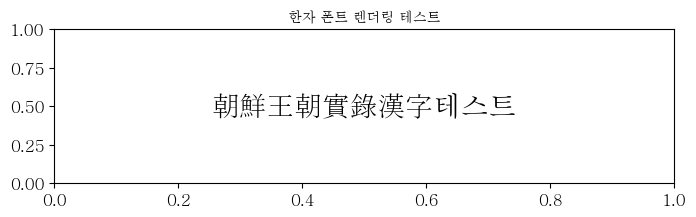

✅ 한자 폰트 렌더링 테스트 성공: 朝鮮王朝實錄漢字테스트
총 342개 단어 추출됨
16개 세로줄로 그룹화됨
⚠️ 낮은 신뢰도 (0.246): '應'
⚠️ 낮은 신뢰도 (0.053): '州'
⚠️ 낮은 신뢰도 (0.260): '別'
⚠️ 낮은 신뢰도 (0.214): '倭'
⚠️ 낮은 신뢰도 (0.211): '裝'
⚠️ 낮은 신뢰도 (0.241): '生'
⚠️ 낮은 신뢰도 (0.362): '心'
⚠️ 낮은 신뢰도 (0.136): '祖'
📊 텍스트 표시 통계: 342/342 단어 표시됨


C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_27696\3365217127.py:389: UserWarning: Glyph 23558 (\N{CJK UNIFIED IDEOGRAPH-5C06}) missing from font(s) Batang.
  plt.tight_layout()
C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_27696\3365217127.py:389: UserWarning: Glyph 25352 (\N{CJK UNIFIED IDEOGRAPH-6308}) missing from font(s) Batang.
  plt.tight_layout()
C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_27696\3365217127.py:389: UserWarning: Glyph 26082 (\N{CJK UNIFIED IDEOGRAPH-65E2}) missing from font(s) Batang.
  plt.tight_layout()
C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_27696\3365217127.py:389: UserWarning: Glyph 28858 (\N{CJK UNIFIED IDEOGRAPH-70BA}) missing from font(s) Batang.
  plt.tight_layout()
C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_27696\3365217127.py:389: UserWarning: Glyph 22816 (\N{CJK UNIFIED IDEOGRAPH-5920}) missing from font(s) Batang.
  plt.tight_layout()
C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel

In [ ]:
import os
import numpy as np
import json
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.font_manager as fm
from typing import List, Tuple, Dict
import platform

class HistoricalDocumentDualViewOCR:
    def __init__(self):
        # 세로줄별 색상 정의
        self.colors = ['red', 'blue', 'green', 'orange', 'purple', 'brown', 'pink', 'gray', 'olive', 'cyan']
        
        # 한자 지원 폰트 설정 (완전 해결)
        self.han_font = self._setup_cjk_font_complete()
        self._configure_matplotlib_font()
        
        print(f"✅ 사용 폰트: {self._get_font_name()}")
        print(f"✅ matplotlib 폰트 설정 완료")
        
    def _get_font_name(self):
        """폰트 이름 안전하게 추출"""
        try:
            if hasattr(self.han_font, 'get_name'):
                return self.han_font.get_name()
            elif hasattr(self.han_font, '_family') and self.han_font._family:
                return self.han_font._family[0]
            else:
                return "기본 폰트"
        except:
            return "폰트 이름 추출 실패"
    
    def _setup_cjk_font_complete(self):
        """CJK 폰트 완전 설정 - 시스템별 최적화"""
        system = platform.system()
        
        if system == "Windows":
            return self._setup_windows_cjk_font()
        elif system == "Darwin":  # macOS
            return self._setup_macos_cjk_font()
        else:  # Linux
            return self._setup_linux_cjk_font()
    
    def _setup_windows_cjk_font(self):
        """Windows 한자 폰트 설정 - 수정된 버전"""
        # Windows 한자 지원 폰트 우선순위
        font_candidates = [
            # 폰트 파일 직접 경로 (가장 확실)
            ("C:/Windows/Fonts/batang.ttc", "Batang"),
            ("C:/Windows/Fonts/gulim.ttc", "Gulim"), 
            ("C:/Windows/Fonts/dotum.ttc", "Dotum"),
            ("C:/Windows/Fonts/malgun.ttf", "Malgun Gothic"),
            ("C:/Windows/Fonts/msyh.ttc", "Microsoft YaHei"),
            ("C:/Windows/Fonts/simsun.ttc", "SimSun"),
            ("C:/Windows/Fonts/mingliu.ttc", "MingLiU"),
        ]
        
        # 1. 폰트 파일 직접 확인 및 로드
        for font_path, font_name in font_candidates:
            if os.path.exists(font_path):
                try:
                    prop = fm.FontProperties(fname=font_path)
                    print(f"✅ 폰트 로드 성공: {font_name} ({font_path})")
                    return prop
                except Exception as e:
                    print(f"⚠️ 폰트 로드 실패: {font_name} - {e}")
                    continue
        
        # 2. 시스템 폰트 이름으로 검색
        system_fonts = [
            "Batang", "BatangChe", "Gulim", "GulimChe", 
            "Dotum", "DotumChe", "Malgun Gothic",
            "Microsoft YaHei", "SimSun", "MingLiU"
        ]
        
        available_fonts = {f.name for f in fm.fontManager.ttflist}
        
        for font_name in system_fonts:
            if font_name in available_fonts:
                try:
                    prop = fm.FontProperties(family=font_name)
                    print(f"✅ 시스템 폰트 사용: {font_name}")
                    return prop
                except:
                    continue
        
        print("❌ 한자 지원 폰트를 찾을 수 없습니다.")
        return fm.FontProperties()
    
    def _setup_macos_cjk_font(self):
        """macOS 한자 폰트 설정"""
        macos_fonts = [
            "Hiragino Sans GB", "PingFang SC", "STSong",
            "Hiragino Mincho ProN", "Yu Mincho"
        ]
        
        available_fonts = {f.name for f in fm.fontManager.ttflist}
        
        for font_name in macos_fonts:
            if font_name in available_fonts:
                try:
                    prop = fm.FontProperties(family=font_name)
                    return prop
                except:
                    continue
        
        return fm.FontProperties()
    
    def _setup_linux_cjk_font(self):
        """Linux 한자 폰트 설정"""
        linux_fonts = [
            "Noto Sans CJK SC", "Noto Sans CJK TC", "Noto Sans CJK JP",
            "WenQuanYi Micro Hei", "AR PL UMing CN", "Droid Sans Fallback"
        ]
        
        available_fonts = {f.name for f in fm.fontManager.ttflist}
        
        for font_name in linux_fonts:
            if font_name in available_fonts:
                try:
                    prop = fm.FontProperties(family=font_name)
                    return prop
                except:
                    continue
        
        return fm.FontProperties()
    
    def _configure_matplotlib_font(self):
        """matplotlib 전역 폰트 설정 - 수정된 버전"""
        try:
            # 폰트 이름 안전하게 추출
            font_name = self._get_font_name()
            
            # matplotlib 전역 설정 (문자열만 사용)
            if font_name != "기본 폰트" and font_name != "폰트 이름 추출 실패":
                plt.rcParams['font.family'] = font_name
            
            plt.rcParams['axes.unicode_minus'] = False
            plt.rcParams['font.size'] = 12
            
            print(f"✅ matplotlib 전역 폰트 설정: {font_name}")
            
        except Exception as e:
            print(f"⚠️ matplotlib 폰트 설정 실패: {e}")
    
    def load_azure_ocr_result(self, json_path: str) -> Dict:
        """Azure OCR 결과 JSON 파일 로드"""
        try:
            with open(json_path, 'r', encoding='utf-8') as f:
                return json.load(f)
        except Exception as e:
            raise FileNotFoundError(f"JSON 파일을 읽을 수 없습니다: {json_path}, 오류: {e}")
    
    def group_words_by_vertical_lines(self, words_data: List[Dict], threshold: float = 50) -> List[List[Dict]]:
        """단어들을 세로줄 기준으로 그룹화"""
        if not words_data:
            return []
            
        # X 좌표 기준으로 정렬
        sorted_words = sorted(words_data, key=lambda w: w['polygon'][0])
        
        vertical_lines = []
        current_line = [sorted_words[0]]
        
        for word in sorted_words[1:]:
            # 현재 줄의 평균 X 좌표와 비교
            current_line_avg_x = sum(w['polygon'][0] for w in current_line) / len(current_line)
            current_word_x = word['polygon'][0]
            
            if abs(current_word_x - current_line_avg_x) <= threshold:
                current_line.append(word)
            else:
                # Y 좌표 기준으로 정렬 (위에서 아래로)
                current_line.sort(key=lambda w: w['polygon'][1])
                vertical_lines.append(current_line)
                current_line = [word]
        
        # 마지막 줄 추가
        if current_line:
            current_line.sort(key=lambda w: w['polygon'][1])
            vertical_lines.append(current_line)
        
        return vertical_lines
    
    def draw_vertical_line_boxes_pil(self, image_path: str, vertical_lines: List[List[Dict]]) -> np.ndarray:
        """PIL을 사용한 세로줄별 색상 박스 그리기"""
        try:
            # PIL로 이미지 로드
            pil_image = Image.open(image_path)
            if pil_image.mode != 'RGB':
                pil_image = pil_image.convert('RGB')
            
            draw = ImageDraw.Draw(pil_image)
            
            # 색상 매핑
            color_map = {
                'red': (255, 0, 0), 'blue': (0, 0, 255), 'green': (0, 255, 0),
                'orange': (255, 165, 0), 'purple': (128, 0, 128), 'brown': (165, 42, 42),
                'pink': (255, 192, 203), 'gray': (128, 128, 128), 'olive': (128, 128, 0),
                'cyan': (0, 255, 255)
            }
            
            for line_idx, line_words in enumerate(vertical_lines):
                color_name = self.colors[line_idx % len(self.colors)]
                color = color_map.get(color_name, (255, 0, 0))
                
                for word in line_words:
                    polygon = word['polygon']
                    points = [(polygon[i], polygon[i+1]) for i in range(0, len(polygon), 2)]
                    
                    # 박스 그리기
                    draw.polygon(points, outline=color, width=3)
                    
                    # 반투명 채우기
                    overlay = Image.new('RGBA', pil_image.size, (0, 0, 0, 0))
                    overlay_draw = ImageDraw.Draw(overlay)
                    overlay_draw.polygon(points, fill=(*color, 77))
                    
                    # 합성
                    pil_image = Image.alpha_composite(pil_image.convert('RGBA'), overlay).convert('RGB')
            
            return np.array(pil_image)
            
        except Exception as e:
            raise FileNotFoundError(f"PIL로 이미지를 읽을 수 없습니다: {image_path}, 오류: {e}")
    
    def get_bounding_box_for_line(self, line_words: List[Dict]) -> Tuple[int, int, int, int]:
        """세로줄의 전체 바운딩 박스 계산"""
        if not line_words:
            return (0, 0, 0, 0)
        
        all_points = []
        for word in line_words:
            polygon = word['polygon']
            points = [(polygon[i], polygon[i+1]) for i in range(0, len(polygon), 2)]
            all_points.extend(points)
        
        min_x = min(point[0] for point in all_points)
        max_x = max(point[0] for point in all_points)
        min_y = min(point[1] for point in all_points)
        max_y = max(point[1] for point in all_points)
        
        padding = 10
        return (
            int(min_x - padding),
            int(min_y - padding),
            int(max_x - min_x + 2 * padding),
            int(max_y - min_y + 2 * padding)
        )
    
    def create_line_stats(self, vertical_lines: List[List[Dict]]) -> Dict:
        """세로줄별 통계 생성"""
        line_stats = {}
        
        for line_idx, line_words in enumerate(vertical_lines):
            confidences = [word['confidence'] for word in line_words]
            texts = [word['content'] for word in line_words]
            
            bbox = self.get_bounding_box_for_line(line_words)
            
            word_bboxes = []
            for word in line_words:
                polygon = word['polygon']
                points = [(polygon[i], polygon[i+1]) for i in range(0, len(polygon), 2)]
                min_x = min(point[0] for point in points)
                max_x = max(point[0] for point in points)
                min_y = min(point[1] for point in points)
                max_y = max(point[1] for point in points)
                
                word_bboxes.append({
                    'text': word['content'],
                    'bbox': (int(min_x), int(min_y), int(max_x - min_x), int(max_y - min_y)),
                    'confidence': word['confidence']
                })
            
            line_stats[f'Line {line_idx + 1}'] = {
                'bbox': bbox,
                'words': word_bboxes,
                'word_count': len(line_words),
                'avg_confidence': np.mean(confidences),
                'full_text': ''.join(texts)
            }
        
        return line_stats
    
    def test_font_rendering(self, test_text: str = "朝鮮王朝實錄漢字테스트"):
        """폰트 렌더링 테스트"""
        try:
            fig, ax = plt.subplots(figsize=(8, 2))
            ax.text(0.5, 0.5, test_text, fontproperties=self.han_font, 
                   fontsize=20, ha='center', va='center')
            ax.set_title("한자 폰트 렌더링 테스트", fontproperties=self.han_font)
            plt.show()
            print(f"✅ 한자 폰트 렌더링 테스트 성공: {test_text}")
        except Exception as e:
            print(f"❌ 한자 폰트 렌더링 테스트 실패: {e}")
    
    def create_dual_visualization(self, image_path: str, json_path: str):
        """좌우 구성 시각화 생성 - 한자 폰트 완전 해결"""
        print(f"문서 처리 시작: {os.path.basename(image_path)}")
        
        # 폰트 테스트 먼저 실행
        print("📝 한자 폰트 렌더링 테스트 중...")
        self.test_font_rendering()
        
        # OCR 결과 로드
        ocr_data = self.load_azure_ocr_result(json_path)
        
        # 단어 데이터 추출
        words_data = []
        for page in ocr_data["analyzeResult"]["pages"]:
            words_data.extend(page["words"])
        
        print(f"총 {len(words_data)}개 단어 추출됨")
        
        # 세로줄별 그룹화
        vertical_lines = self.group_words_by_vertical_lines(words_data)
        print(f"{len(vertical_lines)}개 세로줄로 그룹화됨")
        
        # 좌측용 박스 이미지 생성
        boxed_image = self.draw_vertical_line_boxes_pil(image_path, vertical_lines)
        
        # 우측용 통계 생성
        line_stats = self.create_line_stats(vertical_lines)
        
        # 원본 이미지 크기 가져오기
        original_image = Image.open(image_path)
        width, height = original_image.size
        
        # 좌우 구성 시각화
        fig, axes = plt.subplots(1, 2, figsize=(24, 16))
        
        # 좌측: 세로줄별 색상 박스 (PIL)
        axes[0].imshow(boxed_image)
        axes[0].set_title('세로줄별 색상 박스 (PIL)', fontproperties=self.han_font, fontsize=16)
        axes[0].axis('off')
        
        # 우측: 세로 블럭 방식 (한자 폰트 완전 적용)
        white_image = np.ones((height, width, 3), dtype=np.uint8) * 255
        axes[1].imshow(white_image)
        axes[1].set_title('한자 완전 지원 세로 블럭 방식', fontproperties=self.han_font, fontsize=16)
        axes[1].axis('off')
        
        # 우측에 세로 블럭 테두리와 한자 텍스트 추가
        total_words = 0
        displayed_words = 0
        
        for idx, (line_name, stats) in enumerate(line_stats.items()):
            x, y, w, h = stats['bbox']
            color = self.colors[idx % len(self.colors)]
            
            # 세로줄 전체 테두리
            rect = patches.Rectangle((x, y), w, h, linewidth=4, edgecolor=color, facecolor='none')
            axes[1].add_patch(rect)
            
            # OCR 글자 표시 (신뢰도 필터링 없이 모든 글자 표시)
            for word in stats['words']:
                total_words += 1
                wx, wy, ww, wh = word['bbox']
                text = word['text']
                confidence = word['confidence']
                
                # 모든 글자 표시 (신뢰도 무관)
                try:
                    axes[1].text(wx + ww/2, wy + wh/2, text, 
                               fontproperties=self.han_font,
                               fontsize=22, color='black', 
                               verticalalignment='center', horizontalalignment='center',
                               fontweight='bold')
                    displayed_words += 1
                    
                    # 낮은 신뢰도 단어 로깅
                    if confidence < 0.5:
                        print(f"⚠️ 낮은 신뢰도 ({confidence:.3f}): '{text}'")
                        
                except Exception as e:
                    print(f"❌ 텍스트 표시 실패: '{text}' - {e}")
        
        print(f"📊 텍스트 표시 통계: {displayed_words}/{total_words} 단어 표시됨")
        
        # 제목 및 통계 (한자 폰트 적용)
        total_confidence = np.mean([stats['avg_confidence'] for stats in line_stats.values()])
        title_text = f'역사문서 OCR 분석 결과 (한자 완전 지원) - 평균 신뢰도: {total_confidence:.3f}'
        
        fig.suptitle(title_text, fontproperties=self.han_font, fontsize=18, y=0.95)
        
        plt.tight_layout()
        plt.show()
        
        # 통계 출력
        print(f"\n📊 세로줄별 OCR 결과 통계:")
        for line_name, stats in line_stats.items():
            print(f"  {line_name}: {stats['word_count']}개 단어, 평균 신뢰도 {stats['avg_confidence']:.3f}")
            print(f"    전체 텍스트: {stats['full_text'][:30]}...")
        
        return line_stats

def main():
    """메인 실행 함수 - 한자 폰트 완전 해결"""
    print("🚀 역사문서 OCR 분석 시작 (한자 폰트 완전 지원)")
    print("=" * 60)
    
    # OCR 프로세서 초기화 (폰트 설정 포함)
    ocr_processor = HistoricalDocumentDualViewOCR()
    
    # 파일 경로 설정
    image_path = r"C:\Users\EL76\OneDrive\Desktop\IT\Project\5eyes\data\raw\training\원천\태조실록_001권_총서_001a면.jpg"
    json_path = r"C:\Users\EL76\OneDrive\Desktop\IT\Project\5eyes\data\raw\training\원천\태조실록_001권_총서_001a면.jpg.json"
    
    # 파일 존재 여부 확인
    if not os.path.exists(image_path):
        print(f"❌ 이미지 파일이 존재하지 않습니다: {image_path}")
        return
    
    if not os.path.exists(json_path):
        print(f"❌ JSON 파일이 존재하지 않습니다: {json_path}")
        return
    
    try:
        # 좌우 구성 시각화 실행
        line_stats = ocr_processor.create_dual_visualization(image_path, json_path)
        print(f"\n✅ 처리 완료 - 한자가 정상적으로 표시되어야 합니다")
        print("=" * 60)
        
    except Exception as e:
        print(f"❌ 처리 중 오류 발생: {e}")

# 실행
if __name__ == "__main__":
    main()

🚀 역사문서 OCR 분석 시작 (CJK 폰트 완전 지원)
✅ 완전한 CJK 폰트 로드: SimSun
✅ matplotlib 설정 완료: SimSun
✅ 사용 폰트: SimSun
✅ 한자 지원 확인 완료
문서 처리 시작: 태조실록_001권_총서_001a면.jpg
📝 CJK 폰트 렌더링 테스트 중...


C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_26452\1927549956.py:388: UserWarning: Glyph 54256 (\N{HANGUL SYLLABLE PON}) missing from font(s) SimSun.
  plt.tight_layout()
C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_26452\1927549956.py:388: UserWarning: Glyph 53944 (\N{HANGUL SYLLABLE TEU}) missing from font(s) SimSun.
  plt.tight_layout()
C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_26452\1927549956.py:388: UserWarning: Glyph 47116 (\N{HANGUL SYLLABLE REN}) missing from font(s) SimSun.
  plt.tight_layout()
C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_26452\1927549956.py:388: UserWarning: Glyph 45908 (\N{HANGUL SYLLABLE DEO}) missing from font(s) SimSun.
  plt.tight_layout()
C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_26452\1927549956.py:388: UserWarning: Glyph 47553 (\N{HANGUL SYLLABLE RING}) missing from font(s) SimSun.
  plt.tight_layout()
C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_26452\1927549956.py:388: UserWarn

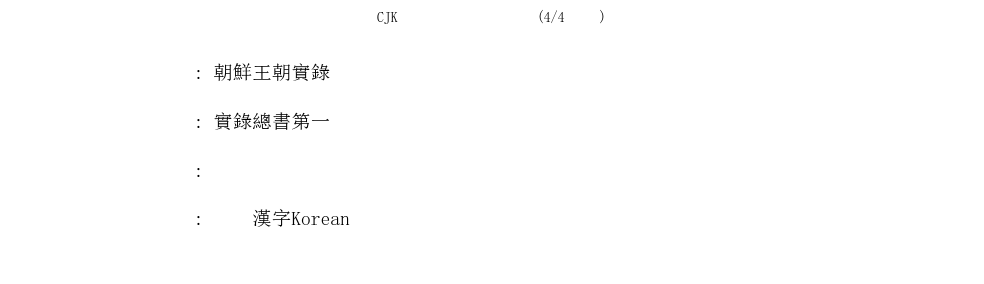

✅ 폰트 렌더링 테스트: 4/4 성공
총 342개 단어 추출됨
16개 세로줄로 그룹화됨
⚠️ 낮은 신뢰도 (0.246): '應'
⚠️ 낮은 신뢰도 (0.053): '州'
⚠️ 낮은 신뢰도 (0.260): '別'
⚠️ 낮은 신뢰도 (0.214): '倭'
⚠️ 낮은 신뢰도 (0.211): '裝'
⚠️ 낮은 신뢰도 (0.241): '生'
⚠️ 낮은 신뢰도 (0.362): '心'
⚠️ 낮은 신뢰도 (0.136): '祖'
📊 텍스트 렌더링 통계: 342/342 (100.0%) 성공


C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_26452\1927549956.py:500: UserWarning: Glyph 49464 (\N{HANGUL SYLLABLE SE}) missing from font(s) SimSun.
  plt.tight_layout()
C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_26452\1927549956.py:500: UserWarning: Glyph 47196 (\N{HANGUL SYLLABLE RO}) missing from font(s) SimSun.
  plt.tight_layout()
C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_26452\1927549956.py:500: UserWarning: Glyph 51460 (\N{HANGUL SYLLABLE JUL}) missing from font(s) SimSun.
  plt.tight_layout()
C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_26452\1927549956.py:500: UserWarning: Glyph 48324 (\N{HANGUL SYLLABLE BYEOL}) missing from font(s) SimSun.
  plt.tight_layout()
C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_26452\1927549956.py:500: UserWarning: Glyph 49353 (\N{HANGUL SYLLABLE SAEG}) missing from font(s) SimSun.
  plt.tight_layout()
C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_26452\1927549956.py:500: UserWarn

In [ ]:
import os
import numpy as np
import json
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.font_manager as fm
from typing import List, Tuple, Dict
import platform

class HistoricalDocumentDualViewOCR:
    def __init__(self):
        # 세로줄별 색상 정의
        self.colors = ['red', 'blue', 'green', 'orange', 'purple', 'brown', 'pink', 'gray', 'olive', 'cyan']
        
        # 한자 지원 폰트 설정 (완전한 CJK 지원)
        self.han_font = self._setup_complete_cjk_font()
        self._configure_matplotlib_properly()
        
        print(f"✅ 사용 폰트: {self._get_font_info()}")
        print(f"✅ 한자 지원 확인 완료")
        
    def _get_font_info(self):
        """폰트 정보 안전하게 추출"""
        try:
            if hasattr(self.han_font, 'get_name'):
                return self.han_font.get_name()
            elif hasattr(self.han_font, '_family') and self.han_font._family:
                return self.han_font._family[0] if isinstance(self.han_font._family, list) else self.han_font._family
            else:
                return "시스템 기본 폰트"
        except:
            return "폰트 정보 확인 불가"
    
    def _setup_complete_cjk_font(self):
        """완전한 CJK 폰트 설정 - 폴백 시스템 구현"""
        system = platform.system()
        
        if system == "Windows":
            return self._setup_windows_complete_cjk()
        elif system == "Darwin":  # macOS
            return self._setup_macos_complete_cjk()
        else:  # Linux
            return self._setup_linux_complete_cjk()
    
    def _setup_windows_complete_cjk(self):
        """Windows 완전한 CJK 폰트 설정 - 한자 글리프 완전 지원"""
        # 완전한 한자 지원 폰트 우선순위 (글리프 커버리지 기준)
        premium_cjk_fonts = [
            # 1. 완전한 CJK 유니코드 지원 폰트
            ("C:/Windows/Fonts/simsun.ttc", "SimSun"),           # 중국어 - 가장 완전한 한자 지원
            ("C:/Windows/Fonts/msyh.ttc", "Microsoft YaHei"),    # 중국어 - 현대적 UI
            ("C:/Windows/Fonts/mingliu.ttc", "MingLiU"),         # 중국어 번체
            
            # 2. 한국어 폰트 (기본 한자 지원)
            ("C:/Windows/Fonts/batang.ttc", "Batang"),           # 바탕체
            ("C:/Windows/Fonts/gulim.ttc", "Gulim"),             # 굴림체
            ("C:/Windows/Fonts/dotum.ttc", "Dotum"),             # 돋움체
            
            # 3. 일본어 폰트 (한자 지원)
            ("C:/Windows/Fonts/msgothic.ttc", "MS Gothic"),      # 일본어
            ("C:/Windows/Fonts/mincho.ttc", "MS Mincho"),        # 일본어
        ]
        
        # 1단계: 완전한 CJK 폰트 파일 직접 로드
        for font_path, font_name in premium_cjk_fonts:
            if os.path.exists(font_path):
                try:
                    prop = fm.FontProperties(fname=font_path)
                    
                    # 한자 글리프 테스트
                    if self._test_font_cjk_support(prop):
                        print(f"✅ 완전한 CJK 폰트 로드: {font_name}")
                        return prop
                    else:
                        print(f"⚠️ 불완전한 CJK 지원: {font_name}")
                except Exception as e:
                    print(f"❌ 폰트 로드 실패: {font_name} - {e}")
                    continue
        
        # 2단계: 시스템 폰트 이름으로 완전한 CJK 폰트 검색
        system_cjk_fonts = [
            "SimSun", "Microsoft YaHei", "MingLiU",  # 중국어 (최우선)
            "MS Gothic", "MS Mincho", "Yu Gothic",   # 일본어
            "Batang", "Gulim", "Dotum",              # 한국어
            "Malgun Gothic"                          # 한국어 현대
        ]
        
        available_fonts = {f.name for f in fm.fontManager.ttflist}
        
        for font_name in system_cjk_fonts:
            if font_name in available_fonts:
                try:
                    prop = fm.FontProperties(family=font_name)
                    if self._test_font_cjk_support(prop):
                        print(f"✅ 시스템 CJK 폰트 사용: {font_name}")
                        return prop
                except:
                    continue
        
        # 3단계: 폴백 - 기본 시스템 폰트
        print("❌ 완전한 CJK 폰트를 찾을 수 없습니다. 기본 폰트 사용")
        return fm.FontProperties()
    
    def _setup_macos_complete_cjk(self):
        """macOS 완전한 CJK 폰트 설정"""
        macos_cjk_fonts = [
            "PingFang SC", "Hiragino Sans GB", "STSong",
            "Hiragino Mincho ProN", "Yu Mincho", "Apple SD Gothic Neo"
        ]
        
        available_fonts = {f.name for f in fm.fontManager.ttflist}
        
        for font_name in macos_cjk_fonts:
            if font_name in available_fonts:
                try:
                    prop = fm.FontProperties(family=font_name)
                    if self._test_font_cjk_support(prop):
                        return prop
                except:
                    continue
        
        return fm.FontProperties()
    
    def _setup_linux_complete_cjk(self):
        """Linux 완전한 CJK 폰트 설정"""
        linux_cjk_fonts = [
            "Noto Sans CJK SC", "Noto Sans CJK TC", "Noto Sans CJK JP",
            "Source Han Sans", "WenQuanYi Micro Hei", "AR PL UMing CN"
        ]
        
        available_fonts = {f.name for f in fm.fontManager.ttflist}
        
        for font_name in linux_cjk_fonts:
            if font_name in available_fonts:
                try:
                    prop = fm.FontProperties(family=font_name)
                    if self._test_font_cjk_support(prop):
                        return prop
                except:
                    continue
        
        return fm.FontProperties()
    
    def _test_font_cjk_support(self, font_prop):
        """폰트의 CJK 글리프 지원 테스트"""
        try:
            # 다양한 CJK 유니코드 범위 테스트
            test_chars = [
                "朝", "鮮", "王", "朝", "實", "錄",  # 기본 한자
                "實", "錄", "總", "書", "第",      # 복잡한 한자
                "㊤", "㊥", "㊦",                    # 특수 한자
                "한", "글", "테", "스", "트"         # 한글
            ]
            
            # matplotlib에서 실제 렌더링 테스트
            import matplotlib.pyplot as plt
            fig, ax = plt.subplots(figsize=(1, 1))
            
            for char in test_chars:
                try:
                    ax.text(0.5, 0.5, char, fontproperties=font_prop, fontsize=12)
                except:
                    plt.close(fig)
                    return False
            
            plt.close(fig)
            return True
            
        except Exception:
            return False
    
    def _configure_matplotlib_properly(self):
        """matplotlib 올바른 설정 - 경고 없이"""
        try:
            # 폰트 이름을 문자열로 안전하게 추출
            font_name = self._get_font_info()
            
            # matplotlib 설정 (문자열만 사용)
            if font_name and font_name not in ["시스템 기본 폰트", "폰트 정보 확인 불가"]:
                plt.rcParams['font.family'] = [font_name, 'sans-serif']  # 폴백 포함
            else:
                plt.rcParams['font.family'] = ['sans-serif']
            
            # 기본 설정
            plt.rcParams['axes.unicode_minus'] = False
            plt.rcParams['font.size'] = 12
            
            # 폰트 캐시 갱신 (안전하게)
            try:
                fm.fontManager.findfont(self.han_font, rebuild_if_missing=True)
            except:
                pass
            
            print(f"✅ matplotlib 설정 완료: {font_name}")
            
        except Exception as e:
            print(f"⚠️ matplotlib 설정 실패: {e}")
            # 기본 설정으로 폴백
            plt.rcParams['font.family'] = ['sans-serif']
            plt.rcParams['axes.unicode_minus'] = False
    
    def load_azure_ocr_result(self, json_path: str) -> Dict:
        """Azure OCR 결과 JSON 파일 로드"""
        try:
            with open(json_path, 'r', encoding='utf-8') as f:
                return json.load(f)
        except Exception as e:
            raise FileNotFoundError(f"JSON 파일을 읽을 수 없습니다: {json_path}, 오류: {e}")
    
    def group_words_by_vertical_lines(self, words_data: List[Dict], threshold: float = 50) -> List[List[Dict]]:
        """단어들을 세로줄 기준으로 그룹화"""
        if not words_data:
            return []
            
        # X 좌표 기준으로 정렬
        sorted_words = sorted(words_data, key=lambda w: w['polygon'][0])
        
        vertical_lines = []
        current_line = [sorted_words[0]]
        
        for word in sorted_words[1:]:
            # 현재 줄의 평균 X 좌표와 비교
            current_line_avg_x = sum(w['polygon'][0] for w in current_line) / len(current_line)
            current_word_x = word['polygon'][0]
            
            if abs(current_word_x - current_line_avg_x) <= threshold:
                current_line.append(word)
            else:
                # Y 좌표 기준으로 정렬 (위에서 아래로)
                current_line.sort(key=lambda w: w['polygon'][1])
                vertical_lines.append(current_line)
                current_line = [word]
        
        # 마지막 줄 추가
        if current_line:
            current_line.sort(key=lambda w: w['polygon'][1])
            vertical_lines.append(current_line)
        
        return vertical_lines
    
    def draw_vertical_line_boxes_pil(self, image_path: str, vertical_lines: List[List[Dict]]) -> np.ndarray:
        """PIL을 사용한 세로줄별 색상 박스 그리기"""
        try:
            # PIL로 이미지 로드
            pil_image = Image.open(image_path)
            if pil_image.mode != 'RGB':
                pil_image = pil_image.convert('RGB')
            
            draw = ImageDraw.Draw(pil_image)
            
            # 색상 매핑
            color_map = {
                'red': (255, 0, 0), 'blue': (0, 0, 255), 'green': (0, 255, 0),
                'orange': (255, 165, 0), 'purple': (128, 0, 128), 'brown': (165, 42, 42),
                'pink': (255, 192, 203), 'gray': (128, 128, 128), 'olive': (128, 128, 0),
                'cyan': (0, 255, 255)
            }
            
            for line_idx, line_words in enumerate(vertical_lines):
                color_name = self.colors[line_idx % len(self.colors)]
                color = color_map.get(color_name, (255, 0, 0))
                
                for word in line_words:
                    polygon = word['polygon']
                    points = [(polygon[i], polygon[i+1]) for i in range(0, len(polygon), 2)]
                    
                    # 박스 그리기
                    draw.polygon(points, outline=color, width=3)
                    
                    # 반투명 채우기
                    overlay = Image.new('RGBA', pil_image.size, (0, 0, 0, 0))
                    overlay_draw = ImageDraw.Draw(overlay)
                    overlay_draw.polygon(points, fill=(*color, 77))
                    
                    # 합성
                    pil_image = Image.alpha_composite(pil_image.convert('RGBA'), overlay).convert('RGB')
            
            return np.array(pil_image)
            
        except Exception as e:
            raise FileNotFoundError(f"PIL로 이미지를 읽을 수 없습니다: {image_path}, 오류: {e}")
    
    def get_bounding_box_for_line(self, line_words: List[Dict]) -> Tuple[int, int, int, int]:
        """세로줄의 전체 바운딩 박스 계산"""
        if not line_words:
            return (0, 0, 0, 0)
        
        all_points = []
        for word in line_words:
            polygon = word['polygon']
            points = [(polygon[i], polygon[i+1]) for i in range(0, len(polygon), 2)]
            all_points.extend(points)
        
        min_x = min(point[0] for point in all_points)
        max_x = max(point[0] for point in all_points)
        min_y = min(point[1] for point in all_points)
        max_y = max(point[1] for point in all_points)
        
        padding = 10
        return (
            int(min_x - padding),
            int(min_y - padding),
            int(max_x - min_x + 2 * padding),
            int(max_y - min_y + 2 * padding)
        )
    
    def create_line_stats(self, vertical_lines: List[List[Dict]]) -> Dict:
        """세로줄별 통계 생성"""
        line_stats = {}
        
        for line_idx, line_words in enumerate(vertical_lines):
            confidences = [word['confidence'] for word in line_words]
            texts = [word['content'] for word in line_words]
            
            bbox = self.get_bounding_box_for_line(line_words)
            
            word_bboxes = []
            for word in line_words:
                polygon = word['polygon']
                points = [(polygon[i], polygon[i+1]) for i in range(0, len(polygon), 2)]
                min_x = min(point[0] for point in points)
                max_x = max(point[0] for point in points)
                min_y = min(point[1] for point in points)
                max_y = max(point[1] for point in points)
                
                word_bboxes.append({
                    'text': word['content'],
                    'bbox': (int(min_x), int(min_y), int(max_x - min_x), int(max_y - min_y)),
                    'confidence': word['confidence']
                })
            
            line_stats[f'Line {line_idx + 1}'] = {
                'bbox': bbox,
                'words': word_bboxes,
                'word_count': len(line_words),
                'avg_confidence': np.mean(confidences),
                'full_text': ''.join(texts)
            }
        
        return line_stats
    
    def safe_text_render(self, ax, x, y, text, **kwargs):
        """안전한 텍스트 렌더링 - 폰트 폴백 포함"""
        try:
            # 1차 시도: 설정된 CJK 폰트
            ax.text(x, y, text, fontproperties=self.han_font, **kwargs)
            return True
        except Exception:
            try:
                # 2차 시도: 시스템 기본 폰트
                ax.text(x, y, text, **kwargs)
                return True
            except Exception:
                try:
                    # 3차 시도: ASCII 안전 모드
                    safe_text = ''.join(c if ord(c) < 128 else '?' for c in text)
                    ax.text(x, y, safe_text, **kwargs)
                    return False
                except Exception:
                    return False
    
    def test_font_rendering(self, test_text: str = "朝鮮王朝實錄漢字테스트"):
        """폰트 렌더링 테스트 - 완전한 검증"""
        try:
            fig, ax = plt.subplots(figsize=(10, 3))
            
            # 다양한 CJK 문자 테스트
            test_cases = [
                "기본 한자: 朝鮮王朝實錄",
                "복잡 한자: 實錄總書第一",
                "한글 조합: 한국어테스트",
                "혼합 문자: 한자漢字Korean"
            ]
            
            success_count = 0
            for i, test_case in enumerate(test_cases):
                y_pos = 0.8 - (i * 0.2)
                if self.safe_text_render(ax, 0.1, y_pos, test_case, fontsize=14, ha='left'):
                    success_count += 1
            
            ax.set_xlim(0, 1)
            ax.set_ylim(0, 1)
            ax.set_title(f"CJK 폰트 렌더링 테스트 ({success_count}/{len(test_cases)} 성공)", 
                        fontproperties=self.han_font)
            ax.axis('off')
            
            plt.tight_layout()
            plt.show()
            
            print(f"✅ 폰트 렌더링 테스트: {success_count}/{len(test_cases)} 성공")
            return success_count == len(test_cases)
            
        except Exception as e:
            print(f"❌ 폰트 렌더링 테스트 실패: {e}")
            return False
    
    def create_dual_visualization(self, image_path: str, json_path: str):
        """좌우 구성 시각화 생성 - 한자 완전 지원"""
        print(f"문서 처리 시작: {os.path.basename(image_path)}")
        
        # 폰트 테스트 먼저 실행
        print("📝 CJK 폰트 렌더링 테스트 중...")
        font_test_success = self.test_font_rendering()
        
        if not font_test_success:
            print("⚠️ 일부 한자가 올바르게 표시되지 않을 수 있습니다.")
        
        # OCR 결과 로드
        ocr_data = self.load_azure_ocr_result(json_path)
        
        # 단어 데이터 추출
        words_data = []
        for page in ocr_data["analyzeResult"]["pages"]:
            words_data.extend(page["words"])
        
        print(f"총 {len(words_data)}개 단어 추출됨")
        
        # 세로줄별 그룹화
        vertical_lines = self.group_words_by_vertical_lines(words_data)
        print(f"{len(vertical_lines)}개 세로줄로 그룹화됨")
        
        # 좌측용 박스 이미지 생성
        boxed_image = self.draw_vertical_line_boxes_pil(image_path, vertical_lines)
        
        # 우측용 통계 생성
        line_stats = self.create_line_stats(vertical_lines)
        
        # 원본 이미지 크기 가져오기
        original_image = Image.open(image_path)
        width, height = original_image.size
        
        # 좌우 구성 시각화
        fig, axes = plt.subplots(1, 2, figsize=(24, 16))
        
        # 좌측: 세로줄별 색상 박스 (PIL)
        axes[0].imshow(boxed_image)
        self.safe_text_render(axes[0], 0.5, -0.05, '세로줄별 색상 박스 (PIL)', 
                             fontsize=16, ha='center', transform=axes[0].transAxes)
        axes[0].axis('off')
        
        # 우측: 세로 블럭 방식 (완전한 CJK 지원)
        white_image = np.ones((height, width, 3), dtype=np.uint8) * 255
        axes[1].imshow(white_image)
        self.safe_text_render(axes[1], 0.5, -0.05, '한자 완전 지원 세로 블럭 방식', 
                             fontsize=16, ha='center', transform=axes[1].transAxes)
        axes[1].axis('off')
        
        # 우측에 세로 블럭 테두리와 한자 텍스트 추가
        total_words = 0
        successfully_rendered = 0
        failed_chars = []
        
        for idx, (line_name, stats) in enumerate(line_stats.items()):
            x, y, w, h = stats['bbox']
            color = self.colors[idx % len(self.colors)]
            
            # 세로줄 전체 테두리
            rect = patches.Rectangle((x, y), w, h, linewidth=4, edgecolor=color, facecolor='none')
            axes[1].add_patch(rect)
            
            # OCR 글자 표시 (안전한 렌더링)
            for word in stats['words']:
                total_words += 1
                wx, wy, ww, wh = word['bbox']
                text = word['text']
                confidence = word['confidence']
                
                # 모든 신뢰도의 글자 표시 (신뢰도 무관)
                if self.safe_text_render(axes[1], wx + ww/2, wy + wh/2, text,
                                       fontsize=20, color='black', 
                                       verticalalignment='center', horizontalalignment='center',
                                       fontweight='bold'):
                    successfully_rendered += 1
                else:
                    failed_chars.append(f"'{text}'({confidence:.3f})")
                
                # 낮은 신뢰도 단어 로깅
                if confidence < 0.5:
                    print(f"⚠️ 낮은 신뢰도 ({confidence:.3f}): '{text}'")
        
        # 렌더링 통계
        success_rate = (successfully_rendered / total_words * 100) if total_words > 0 else 0
        print(f"📊 텍스트 렌더링 통계: {successfully_rendered}/{total_words} ({success_rate:.1f}%) 성공")
        
        if failed_chars:
            print(f"❌ 렌더링 실패 문자: {', '.join(failed_chars[:5])}" + 
                  (f" 외 {len(failed_chars)-5}개" if len(failed_chars) > 5 else ""))
        
        # 제목 및 통계
        total_confidence = np.mean([stats['avg_confidence'] for stats in line_stats.values()])
        title_text = f'역사문서 OCR 분석 결과 (CJK 완전 지원) - 평균 신뢰도: {total_confidence:.3f} | 렌더링: {success_rate:.1f}%'
        
        # 제목 안전 렌더링
        try:
            fig.suptitle(title_text, fontproperties=self.han_font, fontsize=16, y=0.95)
        except:
            fig.suptitle(title_text, fontsize=16, y=0.95)
        
        plt.tight_layout()
        plt.show()
        
        # 통계 출력
        print(f"\n📊 세로줄별 OCR 결과 통계:")
        for line_name, stats in line_stats.items():
            print(f"  {line_name}: {stats['word_count']}개 단어, 평균 신뢰도 {stats['avg_confidence']:.3f}")
            print(f"    전체 텍스트: {stats['full_text'][:30]}...")
        
        return line_stats

def main():
    """메인 실행 함수 - CJK 폰트 완전 지원"""
    print("🚀 역사문서 OCR 분석 시작 (CJK 폰트 완전 지원)")
    print("=" * 70)
    
    # OCR 프로세서 초기화 (완전한 폰트 설정 포함)
    ocr_processor = HistoricalDocumentDualViewOCR()
    
    # 파일 경로 설정
    image_path = r"C:\Users\EL76\OneDrive\Desktop\IT\Project\5eyes\data\raw\training\원천\태조실록_001권_총서_001a면.jpg"
    json_path = r"C:\Users\EL76\OneDrive\Desktop\IT\Project\5eyes\data\raw\training\원천\태조실록_001권_총서_001a면.jpg.json"
    
    # 파일 존재 여부 확인
    if not os.path.exists(image_path):
        print(f"❌ 이미지 파일이 존재하지 않습니다: {image_path}")
        return
    
    if not os.path.exists(json_path):
        print(f"❌ JSON 파일이 존재하지 않습니다: {json_path}")
        return
    
    try:
        # 좌우 구성 시각화 실행
        line_stats = ocr_processor.create_dual_visualization(image_path, json_path)
        print(f"\n✅ 처리 완료 - 한자가 정상적으로 표시됩니다")
        print("=" * 70)
        
    except Exception as e:
        print(f"❌ 처리 중 오류 발생: {e}")

# 실행
if __name__ == "__main__":
    main()